In [55]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import statsmodels.formula.api as sm
import scipy.stats as stats
import pandas_profiling   #need to install using anaconda prompt (pip install pandas_profiling)

%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 20
plt.rcParams['axes.grid'] = True
plt.gray()

from matplotlib.backends.backend_pdf import PdfPages

from sklearn.cross_validation import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

<Figure size 720x1440 with 0 Axes>

In [56]:
vdt = pd.read_excel("C:\\Users\\Harsh\\Downloads\\DSA Capstone Project\\Predicting Shopping Mall Visitors in Specific Week\\Train20.xlsx")

In [57]:
vdt.head(2)

,visitor_id,visits
0,1,30 84 126 135 137 179 242 342 426 456 460 462...
1,2,24 53 75 134 158 192 194 211 213 238 251 305 ...


In [58]:
vdt[' visits'] = vdt[' visits'].apply(lambda x: str(x).lstrip())
vdt.head(2)

,visitor_id,visits
0,1,30 84 126 135 137 179 242 342 426 456 460 462 ...
1,2,24 53 75 134 158 192 194 211 213 238 251 305 4...


In [59]:
vdt[' visits'] = vdt[' visits'].apply(lambda x: str(x).split(' '))
vdt.head(2)

,visitor_id,visits
0,1,"[30, 84, 126, 135, 137, 179, 242, 342, 426, 45..."
1,2,"[24, 53, 75, 134, 158, 192, 194, 211, 213, 238..."


In [60]:
vdt['freq_nums'] = vdt[' visits'].apply(lambda x: np.array(list(x)).astype(int))
vdt.head(2)

,visitor_id,visits,freq_nums
0,1,"[30, 84, 126, 135, 137, 179, 242, 342, 426, 45...","[30, 84, 126, 135, 137, 179, 242, 342, 426, 45..."
1,2,"[24, 53, 75, 134, 158, 192, 194, 211, 213, 238...","[24, 53, 75, 134, 158, 192, 194, 211, 213, 238..."


In [61]:
del(vdt[' visits'])
vdt.head(2)

,visitor_id,freq_nums
0,1,"[30, 84, 126, 135, 137, 179, 242, 342, 426, 45..."
1,2,"[24, 53, 75, 134, 158, 192, 194, 211, 213, 238..."


In [63]:
vdt.head(2)

,visitor_id,freq_nums
0,1,"[30, 84, 126, 135, 137, 179, 242, 342, 426, 45..."
1,2,"[24, 53, 75, 134, 158, 192, 194, 211, 213, 238..."


In [64]:
def week_wise_visits(values):
    list1 = list(range(1, 144,1))
    output = [0] * 144
    for i in range(len(values)):
        wk_n = int(values[i] / 7)
        rem  = values[i] % 7
        if rem == 0:
            rem = 7 
        output[wk_n] = rem
    print(output)
    return output

vdt['wk_wyz_vsts'] = vdt['freq_nums'].apply(lambda x: week_wise_visits(x))

[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 7, 4, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 5, 7, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 5, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 3, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 4, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 3, 0, 0, 0, 4, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 4, 0, 0, 0, 0, 5, 0, 0, 3, 0, 0, 0, 7, 6, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 5, 0, 0, 0, 0, 0, 3, 0, 0, 7, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 4, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 3, 0, 0, 3, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0

[0, 6, 0, 0, 0, 0, 7, 0, 7, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 7, 4, 0, 0, 7, 0, 6, 0, 7, 0, 0, 0, 0, 0, 0, 0, 7, 0, 6, 0, 6, 0, 0, 0, 6, 0, 0, 7, 0, 0, 0, 7, 0, 0, 2, 0, 2, 0, 0, 7, 7, 0, 0, 0, 0, 0, 3, 0, 0, 6, 0, 0, 0, 0, 0, 7, 0, 4, 0, 0, 0, 5, 0, 5, 0, 0, 0, 6, 1, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 6, 6, 0, 4, 6, 7, 0, 0, 1, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 6, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 6, 1, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 5, 6, 0, 4, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 4, 7, 1, 0, 0, 0, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 7, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 4, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 5, 6, 5, 0, 1, 0, 0, 0, 0, 0, 7, 0, 1, 0, 0, 0, 0, 0, 1, 5, 0, 0, 0]
[6, 6, 3, 0, 4, 0, 0, 0, 0, 0, 4, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 1, 0, 4, 0, 0, 0, 4, 0, 0

[0, 1, 0, 0, 1, 4, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 5, 0, 6, 0, 4, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 6, 0, 0, 6, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 7, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 2, 2, 0, 3, 5, 0, 0, 0, 0, 0, 6, 0, 0, 6, 0, 6, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 6, 0, 0, 2, 0, 0, 0, 1, 0, 0, 7, 0, 0, 6, 0, 0, 0, 0, 6, 0, 5, 0, 6, 0, 0]
[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 6, 4, 7, 0, 1, 0, 7, 0, 1, 0, 0, 0, 6, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 1, 7, 0, 0, 0, 0, 0, 0, 7, 2, 0, 0, 0, 0, 6, 0, 0, 0, 4, 0, 1, 0, 0, 0, 0, 6, 0, 0, 0, 0, 1, 1, 5, 0, 0, 0, 0, 0, 0, 7, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 7, 1, 0, 6, 4, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 7, 2, 0, 7, 0, 3, 0, 0, 5, 0, 0, 0, 0, 7, 0, 0, 0, 4, 3, 0, 0, 0, 0, 0, 0, 3, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 7, 0, 0, 2, 1, 0

[0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 4, 0, 6, 7, 0, 0, 0, 7, 1, 1, 0, 1, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 5, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0, 1, 0, 2, 0, 5, 7, 0, 0, 5, 0, 0, 0, 0, 0, 6, 0, 1, 2, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 7, 0, 0, 0, 0, 0, 0, 2, 0, 0, 6, 5, 1, 5, 0, 4, 0, 0, 0, 0, 2, 0, 0, 0, 6, 0, 0, 0, 0, 7, 0, 0, 0, 6, 0, 0, 0, 2, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 4, 0]
[0, 0, 2, 0, 0, 1, 0, 0, 0, 5, 5, 5, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 5, 0, 2, 1, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 5, 0, 0, 6, 2, 1, 2, 0, 2, 6, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 2, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 5, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 1, 6, 0, 0, 6, 0, 1, 2, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 5, 6, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 5, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 4, 3, 0, 1, 0, 0, 0, 0, 0, 3, 0, 0, 2, 0, 0, 6, 0, 5

[3, 5, 0, 0, 0, 4, 0, 0, 0, 2, 0, 5, 0, 0, 0, 0, 0, 7, 0, 0, 4, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 7, 0, 0, 1, 0, 0, 3, 0, 0, 0, 1, 0, 4, 0, 3, 7, 2, 0, 0, 7, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 5, 0, 7, 0, 0, 0, 1, 2, 0, 0, 0, 6, 0, 0, 0, 7, 0, 0, 3, 0, 6, 5, 0, 0, 0, 0, 0, 5, 0, 0, 0, 6, 0, 0, 0, 6, 0, 1, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 6, 6, 4, 0, 0, 0, 0, 6, 0, 0, 0, 0, 3, 0, 0, 0, 5, 0, 0, 1, 0, 4, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 5, 0, 0, 0, 1, 4, 1, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 3, 0, 4, 5, 6, 6, 0, 0, 7, 1, 0, 0, 0, 0, 2, 0, 0, 0, 7, 1, 1, 0, 0, 1, 0, 4, 0, 0, 6, 0, 0, 5, 0, 5, 5, 0, 4, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 6, 0, 6, 0, 0, 0, 0, 2, 7, 0, 0, 3, 0, 0, 0, 7]
[0, 5, 0, 0, 0, 7, 0, 0, 0, 5, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 3, 4, 0, 0, 0, 0, 5, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2

[0, 0, 0, 5, 0, 0, 0, 0, 4, 0, 3, 3, 5, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 2, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 6, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 3, 0, 0, 0, 0, 5, 0, 3, 0, 4, 0, 0, 0, 0, 0, 0, 0, 1, 0, 6, 0, 0, 0, 0, 0, 0, 0, 4, 1, 0, 3, 0, 7, 0, 1, 0, 0, 4, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 6, 0, 0, 0, 0, 2, 0, 0, 0, 0]
[0, 0, 0, 0, 3, 0, 0, 0, 6, 0, 3, 0, 3, 4, 0, 7, 3, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 0, 3, 5, 1, 0, 0, 0, 7, 3, 0, 1, 0, 0, 4, 0, 0, 1, 0, 0, 1, 3, 0, 0, 1, 1, 0, 1, 7, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 7, 0, 7, 0, 4, 0, 0, 0, 4, 7, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 4, 1, 0, 3, 7, 0, 0, 0, 0, 0, 0]
[0, 0, 6, 3, 4, 0, 0, 0, 0, 6, 0, 0, 0, 6, 6, 0, 0, 0, 0, 6, 0, 0, 0, 7, 0, 6, 7, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0

[0, 0, 0, 4, 0, 0, 0, 3, 3, 0, 0, 0, 7, 0, 0, 0, 0, 0, 7, 0, 5, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 5, 0, 0, 1, 0, 7, 0, 0, 0, 4, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 5, 0, 0, 3, 3, 0, 0, 2, 0, 0, 0, 7, 1, 0, 0, 0, 4, 0, 2, 0, 0, 0, 0, 0, 7, 0, 0, 0, 5, 0, 0, 0, 0, 4, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 1, 0, 6, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 7, 6, 0, 0, 0]
[0, 1, 0, 0, 0, 7, 2, 0, 0, 0, 0, 5, 0, 2, 0, 5, 5, 5, 2, 0, 0, 2, 0, 0, 1, 7, 0, 0, 0, 0, 0, 7, 7, 0, 0, 0, 2, 0, 0, 6, 2, 0, 0, 0, 0, 0, 5, 0, 2, 0, 1, 7, 0, 0, 2, 0, 6, 0, 0, 0, 0, 0, 2, 0, 0, 0, 7, 2, 6, 7, 0, 0, 0, 7, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 5, 0, 0, 0, 0, 0, 0, 4, 0, 6, 2, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 6, 4, 0, 4, 0, 0, 0, 7, 0, 0, 6, 0]
[6, 6, 0, 2, 0, 0, 0, 0, 0, 0, 6, 2, 6, 6, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 3, 6, 0, 0, 0, 1, 3, 0, 0

[0, 0, 2, 7, 0, 0, 6, 0, 0, 7, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 0, 5, 7, 0, 2, 3, 0, 0, 5, 2, 5, 0, 5, 0, 0, 1, 0, 6, 0, 0, 0, 0, 1, 0, 0, 5, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 5, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 0, 2, 0, 1, 3, 3, 0, 0, 0, 0, 5, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 3, 2, 0, 0, 0, 0, 0, 1, 2, 0, 0, 2, 2, 0, 2, 2, 5, 0, 1, 6, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[5, 0, 1, 6, 5, 0, 0, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 6, 0, 0, 0, 0, 0, 6, 0, 3, 2, 6, 0, 0, 0, 0, 0, 0, 4, 0, 2, 0, 0, 0, 5, 7, 0, 0, 0, 2, 0, 6, 0, 0, 0, 0, 7, 0, 1, 0, 2, 2, 0, 0, 0, 6, 0, 0, 0, 3, 0, 2, 0, 3, 6, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 3, 0, 6, 3, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 3, 5, 0, 0, 0, 0, 6, 0, 2, 1, 3, 0, 0, 0, 0, 3, 1, 0, 2, 0, 2, 2, 0, 0, 0, 1, 4, 0, 0, 7, 1, 0, 2, 3, 0, 0, 0, 0, 0, 0]
[0, 6, 7, 0, 0, 7, 6, 7, 0, 6, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 7, 0, 2, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 7, 3, 0

[0, 0, 0, 0, 0, 6, 6, 0, 0, 6, 0, 0, 2, 0, 0, 3, 0, 0, 0, 0, 6, 0, 5, 1, 0, 7, 0, 6, 0, 6, 6, 4, 0, 3, 6, 0, 6, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 7, 2, 0, 6, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 2, 0, 0, 0, 0, 0, 1, 0, 2, 5, 6, 0, 0, 0, 0, 7, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 5, 3, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 3, 0, 7, 0, 2, 0, 0, 0, 0]
[0, 1, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 5, 6, 1, 0, 0, 0, 0, 0, 3, 0, 0, 0, 6, 0, 0, 0, 6, 0, 1, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 1, 0, 0, 1, 0, 0, 5, 7, 2, 0, 0, 0, 3, 0, 0, 0, 0, 0, 5, 2, 0, 7, 5, 0, 0, 0, 7, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 7, 3, 5, 0, 0, 0, 0, 0, 2, 5, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 3, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 6, 0, 3, 0, 0, 0, 1, 0, 7, 0, 0, 3, 3, 3, 0, 0, 0, 0, 0, 0]
[0, 6, 3, 0, 0, 6, 0, 0, 0, 3, 0, 0, 0, 0, 7, 0, 1, 0, 0, 0, 0, 0, 0, 3, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 6, 0, 0, 6, 7, 0, 7, 0

[2, 0, 1, 0, 0, 0, 3, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 1, 0, 2, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 3, 0, 0, 5, 0, 5, 0, 0, 0, 0, 3, 7, 0, 0, 0, 0, 0, 3, 0, 0, 5, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 7, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 6, 2, 4, 0, 7, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 3, 0, 0, 0, 0, 7, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 6, 1, 0, 4, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 1, 0, 0, 0, 0]
[0, 6, 4, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 1, 0, 0, 0, 2, 3, 7, 0, 5, 5, 7, 0, 5, 3, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 2, 0, 0, 0, 4, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 5, 3, 0, 6, 0, 0, 1, 0, 0, 0, 0, 0, 3, 0, 0, 2, 0, 3, 0, 0, 6, 0, 0, 0, 0, 2, 0, 0, 0, 6, 0, 0, 3, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 6, 0, 0, 0, 6, 0, 0, 2, 7, 0, 1, 5, 0, 0, 0, 0, 0, 7, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 4, 0, 0]
[3, 4, 0, 3, 0, 0, 3, 5, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 6, 0, 0, 5, 0, 0, 4, 6, 0, 0, 0, 5, 0, 5, 5, 0, 3, 0, 6, 0, 4

[0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 7, 5, 0, 0, 6, 0, 0, 5, 6, 7, 0, 0, 0, 5, 0, 6, 6, 7, 3, 0, 6, 1, 0, 5, 0, 0, 6, 0, 1, 0, 0, 6, 0, 0, 0, 0, 0, 1, 0, 0, 6, 6, 3, 1, 0, 7, 5, 0, 0, 0, 6, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 6, 0, 0, 0, 0, 6, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 6, 1, 0, 0, 3, 0, 0, 6, 0, 0, 1, 0, 0, 0, 5, 0, 0, 0, 3, 0, 5, 0, 3, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 5, 0]
[0, 0, 0, 0, 0, 0, 1, 0, 6, 3, 0, 0, 0, 3, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 4, 3, 1, 0, 0, 0, 7, 0, 0, 0, 1, 0, 0, 4, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 4, 0, 0, 5, 0, 0, 0, 3, 6, 5, 1, 0, 0, 0, 0, 1, 7, 0, 0, 7, 0, 7, 7, 4, 0, 0, 0, 0, 7, 2, 0, 3, 0, 0, 0, 0, 0, 0, 0, 5, 0, 5, 0, 4, 0, 0, 7, 7, 0, 0, 5, 0, 0, 0, 3, 7, 6, 0, 5, 0, 6, 1, 0, 0, 5, 2, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 5, 0, 4, 0, 0, 0, 0, 0, 6, 0, 3, 0, 0, 0, 0]
[3, 4, 6, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 5, 3, 4, 0, 2, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 7, 3, 0, 4, 0, 0, 0, 4, 3, 4

[0, 0, 2, 3, 0, 7, 7, 4, 0, 0, 0, 0, 0, 0, 4, 6, 0, 0, 3, 0, 5, 5, 0, 3, 0, 0, 1, 0, 0, 3, 0, 0, 3, 6, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 5, 0, 0, 0, 7, 0, 3, 0, 7, 0, 0, 3, 0, 0, 0, 0, 0, 6, 0, 0, 1, 0, 6, 4, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 4, 0, 0, 0, 2, 1, 0, 0, 0, 0, 1, 0, 0, 5, 0, 0, 0, 0, 7, 6, 0, 7, 4, 0, 0, 0, 0, 1, 3, 0, 0, 0, 2, 0, 0, 0, 1, 0, 1, 3, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 3, 0]
[0, 0, 0, 0, 0, 0, 3, 1, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 2, 0, 0, 0, 0, 0, 3, 0, 5, 4, 0, 0, 5, 5, 5, 2, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 3, 3, 4, 0, 0, 2, 0, 5, 0, 4, 5, 0, 0, 0, 5, 0, 4, 5, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 7, 2, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 6, 0, 0, 7, 4, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 7, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 7, 0, 5, 5, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 5, 0, 0, 5, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 5

[0, 5, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 5, 0, 0, 0, 0, 0, 0, 0, 0, 7, 7, 0, 0, 1, 0, 0, 7, 0, 0, 0, 7, 1, 5, 0, 6, 0, 1, 4, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 6, 5, 0, 0, 0, 3, 0, 0, 5, 0, 0, 5, 1, 0, 3, 0, 5, 0, 3, 0, 7, 0, 7, 0, 0, 0, 0, 3, 0, 4, 0, 0, 1, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 5, 5, 0, 0, 4, 0, 6, 6, 3, 0, 0, 0, 0, 5, 6, 0, 0, 0, 0, 0, 0, 4, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 3, 0, 0]
[0, 0, 0, 0, 1, 1, 4, 0, 5, 0, 0, 1, 0, 0, 7, 6, 5, 0, 3, 5, 0, 3, 0, 0, 2, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 5, 6, 0, 0, 0, 6, 0, 0, 0, 0, 5, 0, 0, 0, 7, 0, 6, 0, 3, 0, 3, 1, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 4, 3, 0, 0, 0, 0, 0, 6, 3, 0, 0, 0, 1, 3, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 6, 0, 0, 5, 0, 0, 3, 1, 2, 0, 0, 2, 3, 0, 0, 4, 0, 1, 6, 0, 0, 4, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 2, 1, 0, 6, 0, 6, 0, 6, 7, 0, 0, 0, 0, 0, 0, 3, 7, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 7, 0, 6, 1, 0, 0, 4, 0, 0, 6, 7, 0, 0, 0, 0

[3, 3, 0, 0, 0, 0, 0, 1, 0, 0, 0, 7, 1, 7, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 2, 5, 2, 0, 0, 0, 0, 0, 0, 0, 5, 0, 2, 0, 0, 0, 0, 0, 3, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 1, 5, 0, 0, 0, 0, 0, 5, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 5, 0, 6, 3, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 5, 5, 0, 1, 0, 0, 0, 0, 2, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 7, 0, 0, 7, 0, 0, 0, 3, 0, 0, 7, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 7, 0, 5, 6, 0, 3, 0, 5, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 5, 0, 0, 0, 0, 7, 1, 7, 0, 4, 5, 0, 0, 0, 5, 0, 5, 7, 2, 0, 0, 0, 0, 5, 5, 0, 0, 6, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 3, 0, 0, 0, 5, 7, 0, 7, 7, 0, 5, 0, 0, 3, 1, 6, 0, 0, 6, 0, 0, 2, 0, 0, 6, 5, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 4, 0, 0, 4, 0, 0, 0, 7, 0, 0, 0, 6, 0, 5, 4, 0, 4, 0, 0, 0, 7, 2, 0, 0, 5, 0, 0, 0, 1, 0, 4, 2, 4, 0, 0]
[6, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 2, 0, 6, 0, 0, 0, 0, 6, 0, 0, 6, 6, 0, 0, 7, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 5, 2, 0, 7, 0

[0, 0, 0, 3, 0, 0, 3, 3, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 1, 0, 3, 0, 0, 7, 0, 7, 0, 0, 0, 0, 0, 3, 3, 3, 0, 0, 0, 5, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 7, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 7, 7, 0, 0, 0, 0, 0, 0, 0, 3, 0, 3, 0, 0, 6, 0, 3, 0, 5, 0, 0, 2, 0, 0, 3, 0, 0, 0, 7, 0, 0, 0, 3, 2, 0, 0, 6, 0, 3, 0, 0, 0, 5, 0, 5, 6, 5, 5, 0, 0, 0, 1, 0, 0, 0, 0, 0, 3, 0, 3, 3, 0, 7, 7, 3, 0, 3, 0, 0, 3, 0, 0, 0, 0, 0, 0, 1, 0, 0]
[0, 0, 0, 7, 0, 0, 3, 0, 0, 5, 5, 0, 0, 0, 0, 1, 5, 6, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 5, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 1, 0, 6, 0, 0, 0, 0, 0, 0, 3, 0, 6, 0, 5, 5, 0, 4, 0, 0, 0, 2, 0, 0, 5, 0, 0, 0, 0, 5, 1, 1, 5, 0, 0, 0, 1, 6, 0, 0, 1, 6, 0, 0, 0, 0, 0, 0, 1, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 3, 7, 5, 3, 0, 0, 5, 0, 0, 0, 2, 0, 0, 0, 0, 3, 0, 0, 2, 0, 5, 0, 6, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0]
[0, 2, 0, 0, 0, 3, 5, 0, 2, 0, 0, 0, 3, 0, 0, 6, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 5, 5, 0, 2, 3, 0, 0, 0, 0

[0, 2, 2, 0, 7, 0, 0, 0, 0, 0, 6, 0, 4, 3, 0, 3, 0, 1, 3, 2, 5, 0, 2, 0, 0, 0, 0, 5, 0, 0, 2, 7, 0, 6, 0, 3, 3, 2, 0, 4, 0, 0, 0, 0, 3, 0, 0, 0, 0, 7, 2, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 6, 0, 0, 7, 0, 7, 6, 0, 0, 0, 0, 0, 4, 0, 0, 1, 3, 1, 0, 7, 0, 0, 0, 0, 1, 0, 0, 3, 6, 0, 0, 0, 4, 7, 0, 0, 0, 5, 0, 6, 0, 6, 5, 0, 6, 4, 0, 0, 7, 0, 0, 0, 0, 7, 0, 0, 4, 0, 6, 3, 3, 0, 2, 0, 0, 0, 3, 0, 0, 0, 0]
[5, 0, 4, 0, 0, 0, 0, 0, 7, 0, 0, 4, 6, 0, 0, 0, 6, 0, 5, 0, 2, 0, 5, 0, 6, 6, 0, 0, 0, 5, 0, 4, 0, 0, 0, 0, 6, 2, 0, 0, 0, 6, 5, 7, 6, 5, 5, 2, 2, 0, 0, 0, 2, 0, 0, 0, 6, 0, 4, 0, 6, 0, 0, 0, 0, 0, 4, 4, 0, 0, 6, 6, 0, 0, 0, 0, 0, 6, 7, 0, 0, 7, 5, 0, 0, 3, 0, 6, 0, 0, 0, 0, 1, 0, 0, 0, 0, 6, 0, 0, 0, 0, 5, 0, 6, 0, 0, 0, 0, 0, 0, 7, 1, 2, 0, 0, 0, 0, 6, 0, 0, 0, 7, 6, 1, 0, 7, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 0, 3, 0, 5, 0]
[5, 4, 0, 0, 0, 6, 0, 0, 2, 2, 0, 0, 0, 0, 3, 6, 0, 0, 0, 0, 5, 0, 0, 4, 0, 0, 0, 0, 5, 0, 0, 4, 0, 0, 0, 0, 4, 0, 6, 4, 0, 0, 2, 0, 0

[0, 1, 1, 4, 0, 5, 6, 0, 0, 0, 5, 0, 0, 0, 0, 0, 2, 0, 0, 6, 7, 0, 0, 6, 0, 4, 6, 0, 6, 0, 0, 4, 1, 4, 0, 0, 0, 0, 0, 4, 0, 0, 7, 0, 0, 0, 0, 3, 0, 5, 0, 0, 6, 0, 0, 2, 5, 0, 0, 4, 0, 0, 5, 5, 0, 0, 4, 0, 0, 5, 0, 0, 1, 0, 0, 4, 0, 6, 6, 7, 4, 4, 0, 0, 0, 6, 4, 0, 0, 0, 0, 0, 0, 4, 0, 5, 0, 5, 4, 1, 5, 0, 0, 0, 0, 7, 0, 0, 4, 6, 6, 0, 0, 0, 5, 0, 7, 0, 0, 2, 0, 0, 0, 4, 0, 0, 1, 7, 0, 4, 1, 0, 2, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 5, 7, 7, 0, 0, 4, 0, 0, 0, 5, 0, 0, 5, 0, 5, 0, 0, 0, 7, 7, 6, 5, 0, 7, 0, 0, 5, 0, 0, 0, 0, 0, 5, 1, 0, 0, 6, 0, 3, 0, 0, 0, 6, 0, 4, 1, 0, 0, 2, 0, 0, 0, 0, 0, 7, 5, 0, 5, 5, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 4, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 6, 0, 0, 0, 5, 0, 0, 5, 0, 3, 4, 0, 0, 1, 0, 0, 4, 0, 0, 0, 3, 0, 0, 1, 0, 5, 0]
[0, 3, 0, 0, 1, 0, 0, 4, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 4, 0, 0, 3, 0, 0, 0, 1, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

[0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 3, 0, 0, 0, 0, 0, 0, 2, 6, 0, 5, 0, 1, 0, 0, 0, 5, 2, 0, 0, 0, 0, 6, 3, 0, 0, 7, 0, 6, 0, 5, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 7, 0, 7, 1, 0, 7, 0, 2, 0, 3, 0, 0, 0, 0, 1, 0, 0, 6, 1, 0, 0, 0, 0, 0, 2, 6, 2, 0, 0, 0, 0, 7, 0, 6, 0, 2, 0, 1, 0, 5, 0, 0, 0, 3, 2, 5, 0, 7, 0, 0, 2, 0, 5, 2, 4, 2, 0, 3, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 3, 0, 0, 2, 0, 7, 6, 0, 2, 0]
[4, 0, 0, 6, 0, 0, 2, 0, 4, 6, 3, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 2, 0, 0, 4, 2, 0, 0, 6, 0, 0, 0, 6, 0, 6, 0, 0, 4, 2, 0, 0, 0, 0, 0, 2, 0, 0, 4, 0, 2, 0, 6, 0, 3, 0, 0, 6, 0, 0, 0, 0, 0, 7, 7, 0, 7, 6, 0, 0, 2, 0, 2, 0, 0, 0, 0, 6, 2, 0, 0, 0, 0, 7, 0, 0, 0, 2, 6, 0, 6, 0, 2, 0, 0, 0, 0, 3, 0, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 6, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 6, 6, 0, 0, 0]
[0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 5, 6, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 3, 4, 0, 1, 0, 0, 0, 0, 3, 6, 0, 0, 0, 1

[0, 0, 1, 0, 5, 0, 3, 0, 0, 0, 6, 0, 0, 0, 0, 6, 0, 0, 5, 0, 1, 0, 0, 7, 0, 0, 0, 6, 6, 0, 0, 0, 1, 0, 0, 0, 6, 0, 0, 0, 5, 0, 5, 6, 6, 1, 0, 6, 0, 0, 6, 0, 0, 0, 0, 0, 2, 0, 0, 0, 3, 5, 0, 0, 5, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 1, 0, 4, 0, 0, 4, 3, 0, 5, 5, 0, 1, 0, 0, 0, 0, 0, 0, 0, 6, 0, 3, 0, 0, 0, 0, 0, 0, 1, 6, 6, 0, 5, 1, 0, 0, 3, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 3, 6, 2, 0, 0, 0, 0, 0]
[0, 1, 3, 5, 0, 0, 7, 0, 0, 0, 0, 0, 2, 3, 5, 0, 0, 0, 0, 5, 0, 0, 3, 1, 0, 0, 0, 5, 0, 0, 5, 0, 0, 3, 0, 0, 0, 0, 0, 0, 6, 0, 5, 0, 2, 3, 0, 0, 0, 5, 4, 7, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 3, 0, 0, 3, 0, 0, 1, 7, 0, 1, 0, 0, 0, 4, 0, 0, 7, 7, 0, 0, 5, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 5, 0, 5, 0, 7, 2, 0, 2, 2, 0, 5, 0, 0, 0, 0, 0, 3, 5, 0, 0, 2, 2, 0, 0, 1, 0, 0, 0, 4, 0, 0, 7, 0, 0, 7, 0, 0, 0, 3, 0, 3, 0, 0, 0]
[0, 0, 3, 0, 0, 0, 1, 0, 0, 6, 0, 5, 3, 0, 0, 3, 6, 5, 2, 5, 5, 0, 1, 0, 0, 3, 5, 0, 3, 4, 0, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0, 5, 0

[0, 2, 1, 7, 0, 0, 7, 1, 0, 1, 6, 7, 1, 0, 7, 7, 0, 7, 0, 0, 0, 0, 0, 4, 0, 0, 0, 5, 5, 0, 0, 7, 7, 0, 0, 0, 0, 7, 0, 5, 5, 3, 4, 1, 0, 0, 0, 0, 0, 4, 0, 4, 0, 0, 0, 0, 0, 7, 0, 5, 7, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 7, 0, 4, 0, 0, 5, 5, 5, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 7, 0, 0, 0, 1, 3, 7, 1, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 5, 0, 0, 0, 0, 3, 4, 0, 2, 0, 0, 0, 0, 0, 1, 0]
[0, 0, 0, 0, 4, 0, 7, 0, 0, 3, 0, 0, 6, 0, 0, 0, 0, 0, 3, 0, 4, 0, 6, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 6, 6, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 2, 7, 0, 3, 0, 2, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 2, 7, 6, 2, 0, 0, 6, 0, 6, 3, 0, 0, 0, 3, 0, 1, 2, 6, 2, 0, 0, 7, 0, 7, 6, 0, 0, 7, 5, 3, 0, 2, 5, 0, 0, 0, 0, 3, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 2, 0, 0, 1, 1, 7, 0, 0, 0, 2, 7]
[0, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 1, 7, 7, 0, 0, 6, 0, 5, 7, 7, 0, 0, 3, 1, 0, 0, 1, 0, 0, 0, 7, 0, 0, 0, 0, 1, 7, 7, 0

[0, 0, 0, 0, 0, 1, 7, 7, 4, 4, 0, 0, 0, 0, 2, 0, 0, 2, 6, 0, 5, 0, 4, 0, 4, 4, 7, 0, 0, 5, 1, 3, 0, 0, 0, 0, 4, 7, 0, 0, 7, 6, 5, 1, 0, 2, 1, 0, 1, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 0, 0, 5, 2, 4, 0, 1, 2, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 2, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 2, 4, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 5, 0, 4, 4, 0, 0, 0, 0, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 4, 6, 0, 7, 7, 5, 4, 0, 0, 1, 7, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 3, 0, 0, 7, 0, 1, 0, 0, 6, 0, 0, 5, 0, 0, 0, 6, 0, 2, 1, 7, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 7, 7, 4, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 7, 4, 0, 5, 0, 0, 5, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 5, 0, 0, 0, 7, 0, 0, 7, 0, 7, 0, 7, 0, 0, 0, 0, 5, 1, 0, 0, 7, 7, 7]
[0, 1, 0, 3, 0, 1, 0, 3, 0, 0, 2, 0, 0, 0, 5, 0, 2, 0, 0, 3, 0, 0, 5, 0, 0, 0, 0, 5, 0, 0, 1, 0, 0, 5, 4, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0

[0, 0, 4, 0, 0, 4, 0, 1, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 4, 0, 6, 0, 0, 0, 0, 0, 3, 5, 6, 4, 0, 0, 5, 0, 0, 0, 5, 0, 0, 0, 0, 3, 5, 0, 0, 0, 0, 5, 3, 0, 0, 3, 5, 0, 0, 0, 0, 0, 0, 0, 3, 6, 1, 0, 6, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 4, 0, 0, 5, 3, 5, 0, 0, 0, 3, 0, 0, 0, 4, 0, 0, 0, 7, 1, 0, 0, 0, 5, 4, 0, 0, 0, 7, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 6, 0, 0, 0, 7, 0, 0, 6, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 6, 0, 6, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 1, 0, 0, 0, 0, 4, 0, 1, 6, 0, 0, 6, 7, 5, 6, 0, 0, 0, 0, 0, 6, 0, 3, 0, 4, 1, 0, 7, 6, 0, 0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 5, 0, 5, 5, 0, 0, 5, 1, 0, 0, 5, 4, 0, 0, 0, 3, 4, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 4, 0, 3, 0, 6, 0, 0, 5, 0, 4, 5, 0, 6, 0, 5, 0, 0, 1, 0, 0, 0, 4, 5, 0, 5, 0, 6, 0, 0, 0, 2, 0, 0]
[0, 0, 5, 4, 0, 0, 0, 0, 6, 4, 0, 0, 5, 0, 6, 0, 0, 7, 0, 3, 0, 6, 4, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 6, 4, 0, 0, 5, 0, 5, 0, 4, 0, 0

[0, 0, 3, 6, 6, 0, 3, 0, 5, 5, 0, 7, 0, 0, 0, 0, 6, 0, 2, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 6, 6, 0, 1, 0, 5, 5, 0, 0, 6, 0, 3, 0, 0, 5, 0, 6, 3, 4, 5, 1, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 6, 3, 0, 0, 0, 0, 0, 0, 5, 7, 6, 5, 0, 0, 1, 5, 0, 0, 1, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 7, 0, 3, 2, 0, 3, 5, 1, 0, 0, 7, 0, 5, 0, 6, 0, 1, 0, 0, 0, 0, 5, 1, 0, 5, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 6, 0, 0, 0, 0, 0, 2, 4, 0, 0, 1, 0, 2, 0, 0, 0, 0, 6, 0, 1, 0, 0, 0, 0, 2, 0, 0, 4, 0, 0, 1, 0, 5, 0, 2, 0, 0, 1, 6, 0, 0, 2, 7, 7, 6, 0, 6, 5, 0, 0, 0, 0, 0, 0, 0, 0, 4, 1, 0, 2, 5, 0, 0, 0, 0, 6, 4, 0, 3, 0, 0, 0, 4, 0, 5, 6, 0, 0, 0, 4, 0, 0, 7, 6, 0, 3, 0, 0, 2, 2, 2, 5, 0, 6, 0, 2, 0, 0, 0, 6, 0, 0, 0, 6, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 6, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0]
[0, 2, 6, 0, 0, 0, 0, 6, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 7, 0, 4, 2, 6, 0, 0, 0, 1, 0, 0, 3, 0, 0, 5, 0, 6, 0, 0, 0, 0

[0, 0, 0, 6, 0, 1, 0, 7, 7, 0, 0, 6, 0, 0, 0, 0, 0, 0, 5, 6, 0, 6, 0, 0, 1, 0, 3, 6, 4, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 6, 4, 0, 7, 0, 0, 0, 4, 0, 0, 2, 0, 2, 0, 7, 5, 6, 0, 0, 0, 0, 3, 6, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 3, 0, 0, 0, 0, 2, 0, 4, 0, 0, 0, 0, 0, 0, 3, 0, 0, 7, 0, 0, 0, 7, 5, 0, 0, 7, 1, 1, 0, 6, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 7, 0, 0, 0, 1, 0, 7, 0, 0, 0, 0, 0, 3, 7, 0, 0, 4, 0, 0, 6, 0, 1, 0, 0, 0]
[3, 5, 0, 0, 0, 0, 2, 3, 0, 3, 0, 0, 0, 0, 0, 3, 1, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 3, 0, 2, 0, 6, 0, 0, 3, 0, 2, 0, 0, 0, 0, 3, 3, 0, 2, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 3, 3, 0, 0, 0, 0, 0, 5, 2, 7, 3, 0, 2, 3, 3, 0, 0, 0, 0, 0, 3, 0, 0, 0, 7, 0, 5, 0, 0, 0, 0, 0, 3, 0, 3, 3, 0, 3, 0, 0, 2, 0, 0, 7, 0, 0, 2, 0, 7, 0, 3, 0, 0, 0, 0, 0, 1, 0, 3, 0, 0, 0, 7, 0, 6, 0, 0, 0, 0, 3, 1, 0, 0, 0, 7, 0, 1, 0, 0, 1, 1, 0, 0, 0]
[0, 0, 0, 3, 0, 0, 0, 0, 0, 5, 0, 5, 0, 0, 6, 5, 0, 3, 5, 0, 0, 0, 0, 6, 0, 0, 5, 6, 4, 0, 0, 0, 0, 0, 5, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0

[0, 0, 0, 4, 0, 0, 7, 0, 7, 7, 5, 0, 0, 0, 6, 4, 0, 0, 6, 3, 0, 3, 7, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 2, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 4, 0, 0, 6, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 7, 5, 0, 0, 0, 0, 0, 0, 0, 0, 5, 6, 0, 0, 6, 0, 0, 0, 0, 0, 6, 4, 0, 7, 1, 1, 0, 0, 0, 4, 0, 0, 0, 4, 5, 2, 0, 0, 4, 0, 6, 6, 0, 0, 0, 5, 4, 4, 0, 1, 0, 0, 6, 0, 0, 7, 0, 0, 0, 1, 0, 1, 0, 1, 4, 7]
[0, 0, 0, 6, 0, 6, 5, 6, 0, 0, 1, 0, 5, 1, 0, 4, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 6, 0, 0, 3, 0, 0, 0, 0, 1, 0, 4, 0, 0, 0, 0, 6, 6, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 6, 0, 5, 7, 0, 0, 2, 0, 0, 0, 7, 0, 6, 0, 0, 4, 0, 0, 6, 0, 0, 0, 0, 0, 5, 6, 6, 7, 4, 0, 0, 5, 0, 0, 4, 0, 0, 0, 2, 0, 0, 0, 5, 0, 6, 6, 0, 0, 7, 0, 3, 0, 0, 4, 0, 7, 0, 0, 0, 0, 0, 0, 6, 0, 6, 0, 0, 0, 0, 0, 3, 0, 0, 2, 0, 0, 0, 0, 0, 0, 7, 0]
[0, 0, 0, 2, 0, 0, 0, 4, 0, 0, 1, 0, 4, 0, 0, 5, 0, 0, 0, 4, 0, 3, 0, 0, 3, 0, 0, 1, 7, 0, 0, 0, 2, 0, 5, 1, 0, 1, 0, 2, 3, 0, 0, 0, 0

[6, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 2, 6, 0, 3, 0, 0, 3, 0, 6, 0, 0, 3, 0, 0, 3, 0, 0, 6, 0, 4, 3, 0, 3, 0, 3, 0, 0, 0, 0, 3, 0, 0, 4, 0, 6, 0, 6, 0, 0, 0, 0, 0, 6, 0, 0, 3, 0, 0, 4, 0, 0, 0, 0, 6, 0, 3, 0, 0, 6, 0, 1, 0, 0, 0, 6, 3, 2, 0, 0, 3, 7, 6, 0, 0, 1, 4, 0, 0, 0, 0, 0, 5, 0, 5, 6, 2, 5, 0, 6, 0, 0, 0, 0, 0, 0, 0, 7, 0, 6, 6, 0, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 0, 0, 1, 1, 0, 0, 0, 0, 3, 0, 3, 0, 0, 0]
[6, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 3, 0, 4, 0, 0, 0, 5, 0, 4, 2, 7, 0, 2, 0, 4, 4, 0, 6, 7, 6, 0, 2, 4, 7, 0, 6, 0, 0, 4, 0, 7, 0, 5, 0, 0, 0, 4, 1, 2, 0, 0, 0, 4, 0, 4, 0, 0, 0, 0, 4, 0, 0, 0, 6, 0, 2, 0, 0, 0, 0, 4, 5, 0, 7, 5, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 4, 0, 0, 5, 0, 0, 0, 3, 0, 7, 0, 0, 0, 0, 0, 0, 0, 5, 0, 7, 0, 0, 6, 0, 4, 4, 4, 4, 3, 5, 0, 7, 5, 0, 0, 0, 0, 6, 5, 0, 0, 0]
[0, 5, 3, 7, 0, 0, 0, 7, 0, 1, 5, 0, 0, 1, 0, 0, 0, 0, 7, 0, 1, 0, 0, 2, 7, 0, 7, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 1, 0, 7, 0, 0, 7

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 7, 1, 3, 0, 0, 0, 3, 0, 0, 0, 6, 0, 4, 0, 0, 0, 7, 3, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 2, 0, 0, 7, 6, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 5, 0, 2, 6, 0, 0, 4, 0, 0, 0, 0, 0, 6, 7, 0, 2, 1, 1, 7, 0, 5, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 1, 5, 0, 0, 5, 0, 0, 3, 4, 2, 1, 5, 0, 0, 0, 0, 7, 2, 3, 0, 0, 0, 0, 0, 5, 0, 0, 0]
[0, 3, 0, 4, 0, 0, 5, 0, 0, 0, 0, 0, 6, 0, 3, 0, 7, 5, 0, 0, 0, 0, 3, 2, 4, 0, 0, 0, 3, 4, 0, 0, 2, 0, 6, 0, 0, 6, 0, 0, 4, 0, 0, 5, 0, 0, 6, 0, 3, 4, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 2, 0, 0, 1, 0, 7, 0, 0, 0, 6, 0, 0, 0, 0, 3, 0, 5, 0, 0, 0, 7, 0, 1, 7, 0, 5, 0, 5, 0, 6, 6, 6, 0, 3, 0, 0, 5, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 0, 0, 5, 0, 7, 0, 2, 3, 0, 0, 0, 0, 0, 5, 3, 0, 5, 7, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0]
[0, 2, 3, 3, 3, 3, 0, 0, 0, 5, 0, 0, 0, 1, 0, 0, 1, 3, 3, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 4, 0, 0, 1, 0, 3, 0, 0, 0, 1, 3

[5, 0, 0, 0, 0, 0, 6, 3, 7, 5, 5, 0, 0, 0, 0, 5, 0, 0, 0, 7, 0, 0, 6, 6, 7, 0, 0, 0, 0, 0, 0, 6, 0, 5, 0, 6, 4, 0, 6, 0, 5, 0, 0, 7, 2, 1, 5, 0, 0, 0, 0, 7, 4, 6, 0, 0, 2, 7, 3, 3, 0, 6, 0, 0, 0, 3, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 6, 0, 0, 2, 0, 6, 0, 0, 3, 5, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 2, 0, 6, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 6, 0, 6, 2, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 1, 0, 0, 0, 0, 3, 6, 6, 3, 6, 0, 0, 0]
[0, 0, 0, 1, 0, 7, 0, 0, 0, 1, 0, 0, 0, 0, 0, 2, 4, 0, 3, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 1, 1, 6, 0, 4, 0, 2, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 1, 0, 2, 6, 1, 0, 0, 0, 0, 7, 0, 1, 0, 5, 0, 0, 4, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 4, 0, 0, 0, 7, 0, 2, 0, 0, 0, 0, 7, 4, 6, 0, 2, 0, 0, 0, 0, 5, 2, 0, 0, 5, 0, 5, 0, 0, 6, 3, 6, 0, 1, 0, 4, 1, 0, 0, 3, 4, 4, 5, 0]
[4, 0, 0, 0, 3, 0, 0, 0, 6, 4, 7, 0, 4, 5, 0, 5, 1, 0, 0, 3, 0, 0, 0, 0, 0, 0, 5, 0, 0, 6, 0, 0, 0, 6, 0, 0, 3, 6, 0, 0, 0, 0, 0, 6, 0

[0, 0, 3, 0, 7, 5, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 5, 6, 5, 5, 0, 1, 0, 0, 0, 7, 5, 0, 3, 1, 0, 0, 0, 0, 4, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 1, 0, 0, 1, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 1, 5, 3, 2, 5, 0, 5, 1, 4, 3, 0, 0, 0, 5, 0, 0, 0, 2, 0, 3, 0, 0, 7, 1, 0, 2, 0, 0, 0, 7, 0, 1, 0, 0, 0, 3, 0, 2, 0, 0, 4, 0, 0, 0, 1, 0, 0, 0, 4, 6, 4, 0, 1, 0, 1, 1, 0, 0, 0, 6, 0, 0, 0, 7, 3, 3, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 5, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 6, 6, 0, 0, 0, 7, 0, 0, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 6, 7, 0, 0, 5, 0, 0, 0, 4, 2, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 6, 0, 7, 0, 0, 7, 0, 3, 0, 0, 0, 0, 5, 0, 0, 0, 7, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 6, 0, 0, 7, 4, 4, 0, 0, 7, 1, 0, 0, 7, 0, 0, 6, 0, 0, 0, 7, 6, 3, 1, 3, 0, 0, 3, 0, 0, 0, 4, 0, 1, 0, 0]
[0, 2, 2, 0, 0, 3, 0, 1, 0, 0, 0, 0, 0, 1, 0, 3, 1, 0, 5, 5, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 6, 5, 0, 4, 0, 0, 2, 0, 2, 0, 0, 1, 2, 6, 0

[3, 2, 4, 0, 1, 0, 0, 0, 0, 0, 0, 0, 3, 6, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 1, 0, 2, 3, 0, 0, 6, 0, 0, 0, 3, 7, 0, 6, 0, 4, 0, 1, 0, 0, 0, 0, 0, 3, 6, 6, 0, 0, 7, 0, 0, 0, 5, 0, 0, 6, 6, 0, 0, 3, 0, 0, 0, 4, 2, 7, 0, 1, 0, 2, 1, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 1, 0, 3, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 3, 0, 3, 5, 0, 5, 0, 0, 0, 0, 0, 0, 4, 4, 6, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 7, 1, 0]
[0, 0, 1, 0, 0, 0, 3, 0, 0, 2, 5, 0, 3, 0, 3, 0, 0, 0, 0, 0, 1, 3, 5, 0, 0, 0, 0, 0, 0, 0, 6, 6, 5, 7, 3, 0, 6, 0, 0, 5, 0, 0, 0, 5, 1, 0, 0, 0, 5, 0, 3, 0, 2, 7, 0, 0, 0, 0, 1, 0, 6, 0, 0, 0, 0, 0, 0, 6, 0, 0, 1, 0, 0, 0, 2, 0, 6, 0, 0, 6, 0, 0, 0, 0, 0, 2, 3, 5, 0, 0, 0, 0, 0, 3, 0, 0, 0, 3, 0, 1, 5, 1, 0, 0, 0, 1, 0, 0, 0, 3, 0, 0, 2, 0, 0, 0, 5, 0, 1, 1, 0, 0, 3, 2, 0, 0, 5, 0, 0, 0, 5, 3, 0, 0, 0, 0, 2, 0, 6, 0, 0, 1, 0, 0]
[0, 0, 0, 0, 0, 6, 0, 5, 4, 0, 3, 0, 0, 7, 0, 6, 1, 3, 1, 3, 6, 4, 0, 3, 0, 0, 0, 0, 1, 7, 3, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1

[0, 0, 0, 6, 6, 1, 0, 0, 0, 0, 4, 0, 6, 0, 6, 3, 0, 0, 6, 3, 0, 0, 6, 3, 0, 0, 0, 6, 0, 0, 5, 1, 4, 3, 0, 0, 3, 0, 0, 0, 1, 0, 6, 0, 0, 3, 6, 0, 4, 0, 0, 0, 0, 0, 1, 0, 1, 0, 3, 0, 0, 5, 0, 6, 0, 6, 0, 5, 3, 0, 0, 6, 6, 0, 0, 3, 5, 4, 0, 0, 0, 0, 0, 4, 0, 0, 6, 0, 1, 0, 0, 0, 0, 0, 0, 3, 7, 0, 0, 0, 5, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 6, 6, 1, 5, 0, 0, 7, 0, 6, 0, 0, 6, 4, 0, 0, 0, 0, 5, 0, 0, 0, 5, 0, 1, 0, 0, 6, 0, 5, 5, 0, 2, 0]
[6, 0, 0, 0, 0, 0, 3, 0, 0, 7, 0, 5, 0, 0, 0, 0, 5, 0, 0, 4, 0, 7, 0, 5, 4, 1, 3, 0, 0, 0, 0, 1, 0, 6, 5, 0, 0, 0, 0, 3, 0, 7, 4, 0, 0, 3, 0, 0, 3, 0, 0, 0, 0, 6, 0, 0, 3, 0, 0, 0, 0, 7, 0, 4, 1, 5, 0, 4, 0, 3, 0, 0, 4, 0, 0, 7, 3, 0, 0, 0, 0, 0, 0, 7, 0, 7, 0, 0, 3, 0, 3, 1, 6, 3, 3, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 0, 0, 1, 2, 0, 5, 0, 0, 0, 7, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 6, 0]
[0, 4, 6, 1, 0, 0, 0, 6, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 6, 0, 4, 4, 0, 0, 2, 0, 0, 0, 1, 0, 0, 4

[0, 0, 0, 0, 0, 5, 0, 5, 3, 0, 4, 7, 1, 0, 0, 0, 7, 4, 0, 3, 0, 0, 0, 0, 0, 6, 7, 0, 0, 1, 0, 0, 3, 0, 0, 0, 7, 0, 1, 0, 7, 0, 0, 0, 3, 0, 0, 1, 0, 0, 0, 0, 0, 3, 3, 0, 0, 0, 0, 1, 0, 0, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 1, 0, 0, 0, 0, 0, 3, 1, 3, 3, 0, 4, 0, 0, 0, 0, 0, 3, 0, 7, 1, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 5, 0, 0, 5, 0, 0, 0, 6, 0, 5, 4, 0, 6, 0, 2, 0, 0, 0, 0, 3, 1, 0, 0]
[0, 0, 0, 6, 0, 0, 6, 0, 1, 3, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 7, 6, 0, 0, 0, 0, 0, 0, 7, 1, 0, 7, 0, 0, 5, 6, 7, 0, 0, 0, 0, 0, 2, 0, 6, 0, 0, 0, 0, 4, 0, 6, 0, 0, 0, 7, 0, 7, 0, 3, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 4, 4, 1, 0, 0, 3, 0, 7, 0, 0, 5, 7, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 2, 7, 0, 0, 0, 0, 6, 6, 0, 0, 0, 0, 0, 5, 3, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 7, 7, 0, 0, 0]
[2, 3, 7, 4, 0, 4, 0, 0, 0, 0, 7, 4, 5, 0, 0, 7, 6, 7, 1, 0, 0, 0, 0, 3, 0, 0, 6, 0, 0, 7, 7, 1, 0, 0, 0, 0, 2, 7, 0, 7, 3, 0, 0, 0, 2

[0, 6, 0, 0, 0, 0, 0, 3, 6, 0, 6, 3, 0, 0, 1, 1, 6, 0, 0, 6, 0, 1, 3, 4, 0, 4, 2, 0, 1, 1, 0, 3, 0, 0, 1, 3, 0, 3, 0, 0, 0, 4, 0, 6, 5, 0, 0, 0, 0, 0, 0, 0, 3, 1, 0, 0, 6, 0, 0, 3, 2, 3, 0, 4, 0, 1, 0, 0, 0, 0, 0, 0, 6, 6, 2, 6, 2, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 1, 3, 6, 0, 0, 0, 0, 0, 1, 0, 0, 0, 4, 0, 0, 0, 4, 0, 3, 1, 0, 0, 6, 0, 0, 0, 0, 1, 5, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 2, 4, 0, 0, 0, 0, 0, 1, 0, 0, 0]
[0, 3, 0, 5, 0, 0, 0, 0, 7, 3, 2, 4, 0, 0, 0, 0, 5, 7, 3, 4, 4, 6, 7, 0, 0, 3, 0, 7, 0, 0, 0, 0, 2, 0, 0, 0, 4, 0, 7, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 7, 3, 3, 6, 0, 0, 0, 7, 0, 0, 0, 0, 0, 6, 0, 0, 0, 2, 0, 0, 6, 0, 2, 0, 0, 6, 4, 0, 4, 0, 0, 0, 0, 6, 0, 3, 3, 0, 6, 0, 2, 0, 5, 0, 3, 0, 0, 3, 6, 0, 0, 0, 0, 0, 0, 4, 4, 0, 0, 1, 0, 3, 2, 0, 0, 0, 0, 3, 3, 6, 0, 6, 6, 7, 0, 2, 0, 0, 1, 0, 0, 2, 0, 4, 0, 0, 0, 0, 0, 6, 0, 6, 1, 0]
[4, 0, 5, 0, 4, 0, 1, 0, 1, 3, 0, 0, 0, 0, 0, 1, 7, 4, 5, 0, 3, 0, 0, 0, 1, 0, 2, 1, 0, 6, 0, 0, 5, 0, 0, 5, 1, 0, 0, 0, 0, 0, 0, 4, 4

[6, 6, 0, 0, 0, 4, 2, 0, 0, 3, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 3, 0, 0, 0, 0, 0, 0, 0, 2, 1, 4, 0, 0, 6, 0, 6, 0, 6, 2, 0, 6, 1, 0, 0, 6, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 3, 6, 0, 0, 0, 0, 2, 0, 6, 0, 0, 0, 0, 0, 0, 2, 0, 0, 6, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 3, 0, 6, 0, 0, 7, 0, 6, 0, 0, 6, 0, 0, 0, 3, 0, 0, 5, 1, 0, 2, 6, 0, 6, 6, 0, 0, 6, 0, 0, 2, 0, 0, 0, 0, 6, 0, 7, 0, 0, 1, 0, 2, 0, 2, 0, 2, 0, 0, 7, 0, 0, 1, 2, 0]
[0, 0, 0, 0, 6, 0, 3, 0, 6, 6, 0, 4, 2, 0, 2, 0, 6, 7, 6, 0, 0, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 4, 4, 0, 0, 7, 0, 0, 0, 0, 0, 0, 4, 0, 0, 2, 0, 0, 2, 0, 6, 0, 7, 5, 0, 0, 6, 6, 0, 0, 0, 6, 0, 0, 0, 0, 1, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 7, 0, 0, 6, 0, 0, 0, 6, 7, 0, 0, 0, 5, 7, 0, 3, 6, 0, 3, 0, 5, 0, 6, 7, 0, 5, 6, 6, 0, 0, 6, 0, 0]
[0, 0, 6, 0, 1, 0, 0, 0, 0, 0, 0, 0, 3, 4, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 2, 0, 3, 0, 6, 0, 3, 0, 0, 0, 0, 0, 0, 6, 4, 0, 0, 6, 1, 2, 0

[0, 0, 0, 0, 0, 0, 6, 0, 3, 5, 0, 0, 0, 6, 0, 0, 4, 0, 0, 0, 0, 3, 0, 3, 0, 6, 0, 0, 2, 0, 0, 0, 0, 6, 5, 6, 3, 0, 0, 5, 3, 0, 0, 1, 0, 0, 3, 0, 0, 4, 5, 3, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 5, 0, 0, 0, 1, 7, 0, 0, 0, 0, 0, 5, 0, 5, 0, 0, 5, 5, 0, 4, 7, 0, 0, 0, 0, 0, 0, 5, 4, 0, 0, 0, 0, 3, 0, 0, 5, 5, 6, 6, 0, 0, 0, 0, 5, 0, 0, 4, 0, 4, 6, 0, 7, 0, 0, 0, 3, 0, 1, 0, 4, 0, 0, 0, 6, 0, 0, 5, 0, 0, 4, 0, 0, 7, 0, 0, 1, 0, 0]
[0, 0, 0, 0, 0, 6, 0, 0, 0, 2, 6, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 0, 0, 2, 2, 0, 7, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 5, 0, 5, 0, 0, 1, 0, 0, 0, 0, 3, 6, 2, 0, 2, 0, 2, 0, 5, 6, 2, 0, 0, 4, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 6, 0, 5, 0, 4, 3, 2, 0, 0, 1, 0, 6, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 3, 0, 3, 0, 5, 2, 0, 0, 5, 0, 6, 0, 0, 0, 1, 0, 0, 0, 7, 0, 1, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 3, 5, 3, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 7, 4, 0, 0, 3, 0, 0, 0, 1, 6, 0, 4, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 3, 3, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0

[0, 5, 2, 2, 4, 0, 5, 0, 2, 0, 0, 0, 0, 0, 0, 1, 6, 0, 3, 0, 0, 0, 0, 2, 0, 1, 0, 0, 3, 1, 0, 0, 0, 5, 0, 2, 5, 5, 0, 1, 0, 3, 4, 2, 3, 0, 0, 7, 0, 4, 0, 2, 0, 0, 0, 4, 0, 3, 2, 0, 7, 0, 0, 4, 0, 3, 0, 0, 0, 4, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 3, 2, 0, 0, 3, 0, 1, 0, 0, 0, 0, 0, 0, 0, 3, 3, 0, 3, 3, 0, 2, 0, 0, 0, 0, 0, 2, 0, 4, 1, 0, 0, 1, 0, 0, 0, 4, 0, 3, 0, 0, 2, 0, 0, 1, 0, 6, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 1, 4, 0, 5, 0, 7, 1, 6, 6, 1, 5, 6, 0, 0, 0, 0, 7, 0, 0, 0, 5, 0, 0, 0, 0, 6, 7, 0, 0, 1, 0, 0, 0, 0, 7, 0, 0, 1, 1, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 3, 0, 0, 0, 7, 0, 4, 0, 7, 0, 0, 0, 0, 6, 1, 0, 7, 0, 0, 0, 1, 1, 0, 0, 0, 0, 2, 0, 2, 6, 0, 0, 3, 0, 0, 0, 0, 4, 0, 2, 7, 0, 5, 0, 7, 0, 0, 7, 7, 4, 0, 0, 0, 0, 0, 0, 7, 3, 4, 0, 0, 0, 0, 0, 0, 1, 3, 0, 0, 0, 0, 3, 2, 0, 0, 1, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 3, 1, 0, 0, 1, 0, 7, 3, 0, 0, 7, 0, 3, 0, 0, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 1, 0, 3, 0, 1, 6, 0, 1, 0, 0, 0

[0, 0, 6, 1, 5, 0, 5, 4, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 4, 4, 0, 0, 0, 3, 0, 0, 7, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 4, 7, 5, 0, 6, 6, 0, 0, 0, 6, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 4, 0, 0, 0, 0, 3, 0, 7, 1, 3, 5, 0, 5, 0, 7, 0, 1, 0, 5, 1, 1, 0, 0, 0, 1, 3, 4, 1, 1, 0, 0, 0, 0, 7, 0, 0, 0, 5, 0, 7, 0, 0, 0, 0, 0, 0, 6, 0, 1, 0, 6, 3, 5, 0, 0, 4, 6, 4, 0, 6, 4, 0, 7, 0, 4, 1, 6, 0, 0, 0, 0, 0, 0, 0, 7]
[0, 7, 0, 0, 6, 1, 0, 4, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 7, 5, 0, 0, 0, 0, 0, 7, 5, 0, 4, 6, 0, 0, 0, 7, 3, 5, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 6, 0, 6, 0, 0, 6, 0, 4, 0, 0, 0, 5, 0, 1, 0, 5, 0, 6, 0, 0, 7, 6, 5, 7, 0, 6, 0, 0, 6, 0, 3, 0, 7, 7, 0, 0, 0, 1, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 1, 0, 0, 4, 2, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 7, 2, 0, 0, 7, 0, 0, 5, 0, 2, 0, 0, 5, 0, 0, 0, 0, 0, 0, 7, 0, 0]
[0, 5, 0, 0, 4, 0, 7, 0, 0, 6, 6, 7, 0, 5, 5, 0, 0, 0, 0, 0, 0, 4, 5, 0, 0, 0, 0, 0, 5, 0, 7, 4, 0, 6, 0, 0, 6, 3, 0, 3, 4, 0, 4, 4, 7

[0, 5, 0, 0, 0, 0, 3, 0, 0, 0, 1, 1, 0, 4, 3, 0, 0, 4, 3, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 1, 0, 0, 0, 2, 5, 3, 3, 3, 1, 0, 1, 5, 5, 0, 0, 5, 0, 0, 0, 6, 0, 0, 1, 0, 0, 0, 6, 0, 0, 5, 0, 0, 3, 0, 0, 1, 6, 3, 3, 1, 2, 0, 6, 0, 0, 5, 0, 3, 0, 1, 5, 6, 4, 0, 0, 0, 0, 1, 0, 0, 5, 0, 0, 0, 1, 0, 0, 0, 0, 1, 5, 4, 0, 0, 4, 1, 0, 0, 0, 0, 1, 4, 6, 6, 3, 0, 0, 0, 5, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 4, 5, 0, 0, 0, 0, 0, 6, 0, 1, 0]
[0, 5, 0, 0, 0, 3, 0, 0, 0, 7, 0, 0, 0, 7, 2, 0, 0, 0, 5, 0, 1, 0, 0, 0, 0, 0, 0, 4, 0, 5, 7, 5, 0, 0, 0, 0, 0, 0, 5, 3, 7, 0, 6, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 6, 0, 0, 3, 4, 7, 0, 0, 5, 0, 0, 0, 5, 0, 7, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 6, 7, 0, 0, 0, 7, 0, 1, 0, 0, 0, 0, 4, 0, 5, 0, 0, 0, 6, 7, 0, 0, 7, 3, 1, 0, 0, 0, 4, 0, 0, 3, 0, 0, 3, 6, 0, 0, 4, 7, 0, 0, 7, 0, 6, 0, 0, 0, 0, 2, 5, 0, 6, 0, 0, 3, 6, 3, 0, 0, 0]
[0, 2, 0, 6, 3, 0, 3, 6, 0, 0, 0, 0, 0, 2, 0, 0, 3, 5, 2, 0, 6, 0, 0, 5, 0, 0, 4, 2, 6, 0, 0, 5, 6, 0, 0, 0, 0, 0, 6, 0, 0, 5, 0, 0, 0

[3, 0, 0, 0, 0, 7, 6, 0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 1, 0, 5, 0, 0, 0, 0, 1, 0, 0, 0, 5, 3, 3, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 4, 3, 0, 6, 1, 0, 0, 7, 0, 0, 3, 0, 0, 0, 0, 1, 0, 1, 0, 6, 0, 2, 0, 3, 3, 0, 5, 0, 3, 0, 0, 0, 7, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 3, 7, 1, 1, 0, 0, 0, 0, 0, 1, 0, 5, 7, 0, 3, 0, 0, 0, 0, 0, 4, 0, 3, 7, 0, 0, 1, 0, 1, 0, 0, 5, 1, 0, 0, 3, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 1, 0, 7, 0]
[0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 1, 7, 0, 0, 0, 0, 7, 6, 0, 0, 1, 0, 5, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 3, 3, 0, 0, 7, 0, 6, 1, 1, 0, 0, 3, 0, 0, 1, 0, 1, 0, 5, 2, 0, 0, 0, 0, 0, 0, 1, 0, 5, 0, 3, 4, 0, 0, 0, 0, 0, 0, 5, 7, 3, 4, 7, 0, 6, 7, 1, 0, 0, 1, 5, 7, 7, 0, 7, 7, 3, 0, 0, 7, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 6, 0, 0, 0, 0, 5, 0, 0, 0, 7, 0, 3, 3, 0, 0, 0, 3, 6, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 7, 6, 4, 0, 0, 0, 0, 4, 2, 6, 4, 0, 0, 5, 7, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 6, 0, 6, 5, 0, 6, 0, 1, 0, 0, 6, 0, 0

[0, 6, 0, 0, 7, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 5, 6, 0, 6, 0, 0, 2, 6, 6, 7, 0, 0, 0, 7, 0, 0, 0, 6, 0, 0, 4, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 3, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 7, 6, 0, 6, 0, 5, 6, 1, 0, 6, 0, 0, 0, 0, 0, 6, 6, 0, 3, 6, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 6, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 2, 0, 0, 7, 5, 0, 0, 2, 0, 0, 2, 6, 1, 0, 7, 0, 0, 0, 0, 0, 0, 0, 5, 0, 2, 0, 7, 1, 5, 0]
[0, 6, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 4, 0, 7, 0, 0, 4, 3, 0, 0, 4, 2, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 5, 0, 2, 0, 6, 4, 0, 0, 6, 4, 4, 7, 0, 6, 1, 0, 3, 3, 1, 0, 0, 0, 0, 0, 0, 4, 0, 0, 2, 5, 0, 0, 0, 3, 0, 0, 7, 0, 7, 4, 0, 0, 0, 3, 0, 0, 0, 4, 0, 3, 4, 3, 7, 7, 4, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 6, 3, 6, 4, 0, 3, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 4, 7, 3, 0, 2, 0]
[6, 1, 0, 2, 0, 1, 0, 1, 0, 0, 6, 0, 0, 1, 7, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 6, 0, 0, 4, 0, 3, 0, 5, 0, 0, 0, 0, 2, 7, 0, 0, 0, 5, 0, 6

[1, 3, 5, 0, 0, 2, 0, 7, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 2, 3, 6, 1, 0, 3, 5, 0, 0, 1, 0, 0, 0, 0, 0, 0, 4, 1, 4, 0, 5, 1, 5, 3, 3, 0, 0, 2, 0, 0, 5, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 4, 0, 1, 3, 5, 0, 5, 2, 0, 2, 0, 5, 0, 0, 0, 3, 0, 0, 6, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 1, 5, 6, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 2, 5, 0, 0, 3, 0, 0, 4, 0, 0, 0, 0, 0, 2, 3, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 5, 0, 0]
[0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 4, 0, 2, 2, 0, 2, 0, 1, 0, 0, 1, 4, 0, 0, 0, 2, 0, 2, 0, 3, 2, 4, 6, 0, 0, 0, 4, 4, 0, 0, 4, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 2, 0, 0, 0, 0, 2, 4, 4, 0, 4, 2, 0, 0, 4, 0, 4, 1, 0, 4, 0, 0, 2, 1, 0, 2, 0, 0, 0, 4, 2, 0, 0, 0, 0, 2, 3, 3, 4, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 4, 4, 0, 0, 0, 4, 0, 0, 0, 2, 0, 4, 1, 4, 0, 0, 7, 0, 0, 0, 3, 0, 2, 7, 0, 0, 1, 2, 0, 0, 4, 0, 0, 4, 0, 1, 0, 0, 0]
[0, 4, 0, 0, 0, 0, 0, 3, 0, 6, 0, 4, 0, 0, 4, 6, 7, 0, 6, 6, 0, 0, 7, 0, 5, 6, 0, 3, 5, 0, 7, 0, 2, 0, 0, 0, 4, 0, 0, 6, 0, 0, 1, 0, 0

[0, 0, 3, 1, 0, 0, 0, 0, 0, 5, 5, 2, 0, 0, 0, 0, 0, 1, 6, 3, 0, 3, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 4, 0, 0, 0, 4, 0, 0, 2, 0, 0, 0, 0, 0, 1, 3, 2, 0, 0, 0, 1, 0, 3, 2, 7, 0, 2, 0, 0, 3, 3, 0, 0, 0, 3, 0, 0, 2, 1, 3, 0, 0, 0, 0, 0, 3, 5, 0, 3, 0, 4, 4, 0, 3, 0, 0, 5, 0, 7, 0, 7, 0, 0, 2, 0, 5, 0, 0, 1, 0, 4, 7, 0, 0, 0, 0, 0, 0, 0, 3, 5, 0, 3, 0, 5, 0, 5, 0, 3, 0, 0, 1, 0, 0, 0, 5, 3, 0, 1, 0, 0, 2, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[0, 0, 0, 0, 0, 0, 6, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 1, 0, 0, 1, 2, 0, 5, 0, 0, 2, 4, 0, 0, 0, 0, 0, 1, 0, 5, 5, 2, 0, 7, 0, 5, 0, 0, 0, 0, 0, 3, 0, 1, 0, 0, 0, 5, 2, 0, 0, 0, 0, 0, 6, 2, 0, 0, 0, 5, 0, 1, 0, 5, 2, 3, 0, 0, 6, 0, 7, 0, 0, 2, 0, 0, 0, 0, 1, 0, 2, 0, 0, 1, 2, 6, 0, 4, 5, 1, 0, 0, 0, 2, 5, 0, 1, 0, 2, 0, 6, 0, 7, 6, 5, 6, 2, 6, 0, 0, 6, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0]
[0, 0, 0, 0, 0, 0, 6, 7, 7, 3, 0, 0, 0, 1, 6, 0, 1, 0, 0, 3, 6, 1, 0, 0, 3, 6, 5, 5, 0, 0, 5, 0, 0, 4, 6, 0, 0, 0, 0, 6, 0, 3, 0, 0, 3

[0, 3, 0, 0, 0, 6, 0, 6, 6, 4, 0, 6, 0, 0, 0, 1, 0, 0, 1, 0, 1, 2, 6, 0, 2, 2, 0, 0, 4, 0, 4, 2, 6, 0, 2, 0, 4, 6, 3, 0, 0, 0, 0, 5, 2, 0, 0, 0, 6, 1, 0, 1, 0, 3, 0, 0, 7, 6, 0, 1, 6, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 7, 0, 0, 6, 0, 0, 0, 0, 0, 3, 7, 0, 0, 0, 0, 0, 0, 2, 6, 0, 0, 0, 1, 0, 0, 0, 4, 0, 1, 0, 4, 6, 0, 2, 0, 0, 4, 0, 3, 6, 0, 0, 5, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 6, 0]
[0, 2, 0, 2, 0, 4, 0, 0, 0, 0, 0, 4, 0, 0, 0, 5, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 5, 6, 5, 0, 4, 0, 0, 0, 5, 4, 0, 0, 6, 0, 2, 0, 0, 6, 5, 0, 7, 6, 5, 5, 2, 6, 0, 0, 6, 0, 0, 1, 0, 6, 0, 4, 0, 6, 0, 0, 5, 0, 0, 6, 6, 0, 0, 0, 0, 1, 5, 0, 6, 4, 0, 0, 0, 4, 0, 0, 6, 6, 6, 0, 6, 0, 0, 4, 5, 0, 0, 0, 0, 0, 4, 6, 0, 0, 0, 5, 0, 0, 0, 0, 0, 6, 0, 0, 1, 0, 0, 0, 0, 4, 7, 0, 3, 0, 0, 0, 0, 0, 5, 3, 0, 0, 7, 0, 0, 0, 0, 0, 5, 0, 6, 0]
[0, 0, 0, 5, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 5, 0, 5, 0, 0, 0, 0, 1, 5, 0, 0, 5, 0, 6, 5

[0, 0, 2, 0, 2, 0, 0, 6, 6, 0, 4, 4, 0, 0, 0, 0, 0, 0, 4, 0, 2, 0, 0, 0, 0, 0, 3, 2, 0, 0, 3, 7, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 6, 2, 2, 2, 0, 5, 0, 3, 5, 0, 0, 2, 0, 0, 0, 5, 0, 0, 0, 0, 7, 0, 3, 6, 0, 0, 0, 0, 5, 7, 0, 0, 4, 0, 0, 0, 4, 7, 6, 6, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 5, 3, 0, 5, 0, 0, 7, 0, 1, 0, 5, 0, 5, 0, 0, 0, 0, 6, 0, 7, 7, 0, 0, 0, 0, 5, 0, 0, 0, 3, 3, 0, 0, 3, 0, 0, 3, 3, 0, 3, 0, 0, 2, 5, 0, 0, 0, 5, 0, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 6, 3, 0, 0, 1, 0, 0, 0, 3, 0, 0, 0, 0, 0, 6, 6, 0, 0, 0, 0, 0, 0, 0, 6, 6, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 6, 1, 0, 0, 6, 2, 1, 0, 0, 0, 7, 0, 3, 3, 3, 6, 0, 6, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 7, 0, 2, 0, 2, 7, 7, 0, 0, 0, 0, 2, 0, 0, 1, 0, 1, 6, 0, 0, 2, 2, 2, 0, 0, 0, 3, 0, 0, 0, 0, 4, 0, 0, 0, 0, 1, 3, 0, 3, 0, 0, 0, 1, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 3, 0, 0, 2, 1, 0, 2, 0]
[0, 0, 5, 7, 0, 0, 0, 0, 3, 0, 0, 0, 3, 0, 0, 2, 1, 0, 2, 3, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 3, 5, 3, 2, 5, 0, 3, 0, 0

[0, 1, 0, 6, 0, 5, 0, 0, 6, 5, 4, 5, 0, 0, 0, 1, 6, 0, 0, 0, 5, 1, 0, 0, 6, 0, 0, 0, 5, 0, 0, 0, 6, 0, 6, 0, 7, 0, 0, 0, 5, 0, 0, 5, 2, 0, 0, 5, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 6, 0, 0, 6, 0, 4, 5, 0, 0, 1, 3, 3, 0, 0, 4, 3, 5, 5, 0, 0, 2, 6, 0, 1, 0, 0, 0, 0, 7, 0, 0, 6, 0, 5, 0, 6, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 1, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 5, 3, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 4, 0]
[6, 5, 5, 2, 0, 4, 6, 5, 0, 4, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 6, 0, 3, 0, 0, 0, 5, 2, 0, 0, 0, 0, 0, 3, 5, 5, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 6, 0, 1, 5, 0, 0, 7, 0, 0, 0, 0, 3, 0, 0, 0, 6, 0, 4, 6, 0, 4, 2, 0, 0, 5, 0, 3, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0, 0, 7, 5, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 4, 6, 0, 0, 5, 0, 0, 1, 0, 0, 4, 0, 0, 0, 6, 0, 6, 0, 1, 0, 0, 7, 0, 0, 0, 0, 0, 4, 1, 0, 0, 6, 0, 0, 5, 5, 0, 1, 0, 0, 0, 0, 5, 7]
[0, 0, 0, 6, 0, 0, 4, 4, 6, 0, 4, 0, 0, 2, 2, 0, 0, 0, 4, 0, 2, 0, 0, 6, 4, 0, 0, 0, 0, 0, 1, 0, 2, 1, 2, 0, 0, 0, 0, 0, 0, 1, 2, 0, 0

In [65]:
vdt.head(2)

,visitor_id,freq_nums,wk_wyz_vsts
0,1,"[30, 84, 126, 135, 137, 179, 242, 342, 426, 45...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, ..."
1,2,"[24, 53, 75, 134, 158, 192, 194, 211, 213, 238...","[0, 0, 0, 3, 0, 0, 0, 4, 0, 0, 5, 0, 0, 0, 0, ..."


In [66]:
tot_wks = list(range(1,145,1))
wk_str = ["week"]
wk_cols = ['{}_{}'.format(a,b) for b in tot_wks for a in wk_str]
wk_cols

['week_1',
 'week_2',
 'week_3',
 'week_4',
 'week_5',
 'week_6',
 'week_7',
 'week_8',
 'week_9',
 'week_10',
 'week_11',
 'week_12',
 'week_13',
 'week_14',
 'week_15',
 'week_16',
 'week_17',
 'week_18',
 'week_19',
 'week_20',
 'week_21',
 'week_22',
 'week_23',
 'week_24',
 'week_25',
 'week_26',
 'week_27',
 'week_28',
 'week_29',
 'week_30',
 'week_31',
 'week_32',
 'week_33',
 'week_34',
 'week_35',
 'week_36',
 'week_37',
 'week_38',
 'week_39',
 'week_40',
 'week_41',
 'week_42',
 'week_43',
 'week_44',
 'week_45',
 'week_46',
 'week_47',
 'week_48',
 'week_49',
 'week_50',
 'week_51',
 'week_52',
 'week_53',
 'week_54',
 'week_55',
 'week_56',
 'week_57',
 'week_58',
 'week_59',
 'week_60',
 'week_61',
 'week_62',
 'week_63',
 'week_64',
 'week_65',
 'week_66',
 'week_67',
 'week_68',
 'week_69',
 'week_70',
 'week_71',
 'week_72',
 'week_73',
 'week_74',
 'week_75',
 'week_76',
 'week_77',
 'week_78',
 'week_79',
 'week_80',
 'week_81',
 'week_82',
 'week_83',
 'week_84',
 

In [67]:
data = list(vdt['wk_wyz_vsts'])


In [68]:
df = pd.DataFrame(data)
df.head(2)

,0,1,2,3,4,5,6,7,8,9,...,134,135,136,137,138,139,140,141,142,143
0,0,0,0,0,2,0,0,0,0,0,...,0,1,2,0,0,0,0,0,0,0
1,0,0,0,3,0,0,0,4,0,0,...,5,0,0,3,0,0,3,0,0,0


In [69]:
vdt.head()

,visitor_id,freq_nums,wk_wyz_vsts
0,1,"[30, 84, 126, 135, 137, 179, 242, 342, 426, 45...","[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, ..."
1,2,"[24, 53, 75, 134, 158, 192, 194, 211, 213, 238...","[0, 0, 0, 3, 0, 0, 0, 4, 0, 0, 5, 0, 0, 0, 0, ..."
2,3,"[51, 143, 173, 257, 446, 491, 504, 510, 559, 6...","[0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, ..."
3,4,"[1, 20, 22, 92, 124, 149, 211, 335, 387, 390, ...","[1, 0, 6, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ..."
4,5,"[34, 51, 56, 106, 110, 121, 163, 233, 266, 275...","[0, 0, 0, 0, 6, 0, 0, 2, 7, 0, 0, 0, 0, 0, 0, ..."


In [144]:
# Feature Engineering to create new variables from existing variables
max_day_bw_visit = []
min_day_bw_visit = []
avg_visit_week = []
avg_visit_Month = []
vistits_Mon = []
vistits_Tue = []
vistits_Wed = []
vistits_Thu = []
vistits_Fri = []
vistits_Sat = []
vistits_Sun = []
prob_of_visit = []
most_visited_day = []
z = []
for i in vdt.freq_nums:
    l = len(i)
    
    avg_visit_week.append(l/144)
    avg_visit_Month.append(l/34)
    M=0
    T=0
    W=0
    TH=0
    F=0
    ST=0
    SN=0
    for a in range(0,l):
        if i[a]%7 == 1:
            M = M + 1
        if i[a]%7 == 2:
            T = T + 1
        if i[a]%7 == 3:
            W = W + 1
        if i[a]%7 == 4:
            TH = TH + 1
        if i[a]%7 == 5:
            F = F + 1
        if i[a]%7 == 6:
            ST = ST + 1
        if i[a]%7 == 0:
            SN = SN + 1
    vistits_Mon.append(M)
    vistits_Tue.append(T)
    vistits_Wed.append(W)
    vistits_Thu.append(TH)
    vistits_Fri.append(F)
    vistits_Sat.append(ST)
    vistits_Sun.append(SN)
    z.append(M)
    z.append(T)
    z.append(W)
    z.append(TH)
    z.append(F)
    z.append(ST)
    z.append(SN)
    mx =(max(z))
    if mx == M:
        
        freq_day = 1
    elif mx == T:
        
        freq_day = 2
    elif mx == W:
        
        freq_day = 3
    elif mx == TH:
        
        freq_day = 4
    elif mx == F:
        
        freq_day = 5
    elif mx == ST:
        
        freq_day = 6
    elif mx == SN:
        
        freq_day = 7
    most_visited_day.append(freq_day)
    prob_of_visit.append(mx/l)
    z.clear()
    

In [145]:
max_day_bw_visit.clear()
min_day_bw_visit.clear()
    
    

In [146]:

import numpy as np
for t in vdt.freq_nums:
    diff = np.diff(t)
    print(diff)
    dff = list(diff)
    mx1 = (max(dff))
    mn1 = (min(dff))
    max_day_bw_visit.append(mx1)
    min_day_bw_visit.append(mn1)



[ 54  42   9   2  42  63 100  84  30   4   2  21 111   6   4 100  19  21
  43  17  82  38   4  18   8]
[ 29  22  59  24  34   2  17   2  25  13  54  99  14  40  18  17  78  48
 112   8  20   2  86  36  60  19  19   2]
[ 92  30  84 189  45  13   6  49  57 103  16  34  31  33  20   3  11  15
  34  13   8   7  10   2  12]
[ 19   2  70  32  25  62 124  52   3  16  54  29  20  11  80  31  25 105
   2  17   8  20 155  22]
[ 17   5  50   4  11  42  70  33   9  70  14  21 101  11  13  60   2  63
   2  20   4   6  33  99  81]
[ 22 106   2  29  11  73   4  24  10  37   4 142  59  21  10  43  54   8
  83  38   9  30  48   3  69   6]
[ 32 114  34  15   9   5   2   3   5   9 162  64   2   8   4   3 119  44
   2  20  42  15  10  44  34   1  54  29]
[  3  46  31 117  37  98  10  74  28  26  41   8  62  14  12   8  58   4
   3   6  10  19   6  14  47  40  16   8  34  33  25]
[  2  65  26   5   3   5   4  36  25  46  14  11   2  30  30  36  13  14
   2   4  34 133 100  72  17  11   7   1  42  73   3  5

[ 56 133  10   3   7   8  27  35  18   7  77  53 137  76  20  34   1  79
  80  10   8  30  61  13]
[  6  39  21  42  14   9 102  74  32   6   3  40  16  29   7  33  32  12
  56  14  14  53   1  13   3   5  94  18  10  14   1  45  21  32   6  13]
[161  31   8  38 105   2   4   9   3  44   1  55  26  12   7  25  10   5
  33   8  11  41   9  44   3  60  64   8   2   5 103  13]
[ 25  15   9  56   3  19  41  81   7  14  42  34  17  30  20  26   7  28
  28  47  14  14  35  14  21  34  40   5  10  18   9  32  33   2 123]
[ 28   6   1  14 130  23  19  16   1  17   7  17  31  36  73  19   4   1
  34   9  31   6  26  95   3  39  41  16  41  43   9  35  50   6  20  16]
[ 33 138  16  99  56  55  25   3 114   2  38  23  10   3  27   1   6  10
  15  30  18  12   4   8  47  13  71  34   4  28]
[  6   7  47  56   2  10  65  36  34  91  84  26   3  48   6 109  36  23
  19   1  50  16  40  72  52  50]
[ 21  14  92 118   1  28  18   3  21  13  14   3  32   6  15   1  26   8
   9  81  11  57   1   7   9  

 10 16  4  1 59 10 20  7 17  6 19 15 79]
[ 12   3  27  15  17  13  28   1  10  42  56  32   3  67  84  41  36  15
  27   1  25  37  46  11   3  36  16   2   9  45 126  29  13   3]
[ 4 26  5 21 51 19 61 22 18 15  7  2 11  6 40 21 14 12 65 32 17 19  5 46
  5  7 33 11 14 48 55  8 21  7 22 91  7 32 45  7]
[ 40  19 142   9   2  20  23  74  20  55  39  52   5   1  35   1   7   6
  45  21  52  44  13   7   1  23  39  22   2  25  28  10  51  31  16   3]
[ 41   8  21  13   1  27   1  24  20  88 106  34   3  26 104  10  26  20
  13   8  19  24  34   6   1 175  31  39   8   3  19   6]
[  2 117   3  63  56  81  24  28   1  30  13  22  10  22  47  37  31  49
  12  62   9  13   3   1   2  42  29   6   4   5   8  11  21  52  12  24
  10  13]
[ 21 110  11   3  62   5  28  17  21  39  10  59  81   2   7  83   6   8
   3   3   7  54   4  12  11  85   6   5   3  55   1   9  18  29 100]
[  6   8  40   9 152 198   6  28  68   9  15   7   9  10  16  14  76  15
  26  10  17  35  12  23  29   6  45  11  17  5

 12 20 19 27 49 89  3  1 74  9  7  1  5 73  7 18  1]
[15  5  4 12 55 24 21 18 21  4 24 10 14 49 13 28 24 54 35 14 32 23  5 23
 13  5 13 58 10 67 56 52  9 13 15 54 66  2]
[ 18  31  13  16  56  21  22   6  62   1  18  20  24   2  64   8  30  17
   7   5   6 104   3 138   3   3  22  41  33   8  28   7  14  46  53  15]
[ 20   9  13  11  92  24  98   6  22   6   1  70  13   1  55   8  31  33
   7   1   4   8  28  21  21  56  23 107  16  30   6  21  25  43]
[137  14  19  39  45  12  67   9   3  95  19  32   2   1  41   4  10  39
  15   1   2   2  21   3   1  82  59  10  31   7   1  19  35  33   9   7
   4  19  14  20]
[  6  30  42   6   7  21  49 182  13  16  16  38  26  13  29  17  55   8
   8   6  64   6   6   1  12  16  13  50   5   2   7  22  26  14  30  40]
[ 1  9 16 21 90 38  6 29  8 13  7 11  5  6 30  8 55 25 19 17 41 33  3 46
  8 30 27 82 10 39 28 57 34]
[11 17  7 60 36 41 14 34 38 20  1  4 21  1  9 39 31 21 22 56 42 74 48 42
  2 19 35 51 29  4 15  1 13 36 27 22  7 30]
[40  2 12 24  

 42 47  5 24 31  2  8 38  3 18 18 50 13 23 36]
[ 31  68  80  22  18  33  40  18  10  29   4  55   7  36  21  35   9  20
  20   7   9  12   3  25  22 160  18   2   8   7  10  35  33  16   5   6
  27   5   4   2]
[27 65 41  1 19 22 35 54 14 10 35  5  8 29  1  3 15 21  1 41 50 15 19  7
 30 12 16 40 51 31 25 13 26 22 49  1 63 10 16 14  8]
[ 3 18 58  1 14 22 45  4 13  4 32 12 19  7  3 11  1 58 11 14  8 27 86 46
  1 11 31 15 11 50 13 26  5 19 68 10 14 20 78  8  2 38]
[ 13  45   1  25  68   9  19  11   4  28   8   7  37  22   3  29  37  12
  15   3  70   7  24  35  46  20   1  19  33  30  19 115 132   7  26]
[ 13   8  21   8  13  19  16   3   2  10  41   8  56 119   8  13   7  63
  26   2  28  19   4   2  24  42   1   4  51   3  31  29  38  57  66  36
   5  12  15   1   5  35]
[ 7 14  4  7 85 31  8 37 20 76 41  5  1 14 14 21 14 22 17 16 18  2  6  7
 38  2  6 14 13  5 27  1 43 21 36 27 15 20 43 19 30  4 21]
[59 95  3 53 22 13  1 16  4 43  4 10  6 40 21  4 16 34 56 30 46 27 12 37
 36 22 10 16 4

[ 4 28 15  6  1 26 13 27 20 13 26  6 31 33  7 40 43  9  6 11 26 56 42 34
 23 14 49 34  6 11 15 26  2 30  4 20 72 12 37  1 24  5  3 30]
[14 14 63 21 27 29 42 14 42 49 70 32 93  1 21  3 11  5  3  1 10 20 21  3
 21 28 91 21  3 85  6 36 37 15 24]
[  1  18  13   4  14   7  56  17  43  21   6  18  10  22   6  43  17  24
  21  33   2  21  23  47   4  94  23  23  38  14   7  22  25 170   7   3
  16   3]
[62 21 51  5 13  5 97 20 28 71 10 68  6 13  1 25 21 28  8 22  9 12  6  6
 44 57  7  1 14 10 28 31  6  1 38  8  3  9 33  4]
[ 37  19  40  48   2  10  11  14   5  11  15  11  28   3   4  38  11  30
  40  14  10  35   6  19   1   6  25  45  21  11  66  25  14 101  46  34
  18  11  10  21   3]
[16 42 66 11  4  1  7  9 23  1  8 69  2 16 34 12  7  3 20 11 24 54  9 11
 11 31  4 12 26  3 25  2 27 29 19 60 10 84  9  5 25 66]
[12 21  7  9 70 21 49  5  2 22 13  8  9  6 49 82  6  4  2  4 12 19 14  7
  6  3 14  8 22 29 67  5  6 26 13 49  4 10 64 37 18]
[26  1  1  9 14 28  3 18  1  2  9 23 15  2 23 19 23  5 

 24 14  1  6 14  7  4 21 38 11 10 15  9 37 20  3  6  2 32  6 60 35]
[  4  10   9  20   2   4   8  29  24   5  14   6  35  12  21  18  39  20
   1   7  20  14  17   4  15   3   1  43 155   3   4  22  15  13  27   8
   4   5  11   8  85  23   2  18  13  16   5   2  13  26   9  92]
[ 7 42 21  4  7 28  4  3 42 21 10  8  7  6 18 10  7 25 46 50 13 14 27 11
 26 19 38 33 13 22 13  4 12 21 14 35 19  1 17 29  9 60 32 43  7 34  6  5]
[ 6  1  3 13 18 17 50 11 25  3 24 29 20 18  4 45 10 14 42 22 37 49 34 47
 10 47  1 22 33  3  4 65  8 16  2 23 33  7 27  8 25  6]
[39  8  4 21  6 20 17 36 70 28 22 13 14  5  9  7 36 69 21 22 27  7 35 42
 55  6  5  1  5 33 10 44  9 12 10  5 34 51  7  6 23 11 19 25]
[22  7 45 94  1 42  7 25 37  7 29 10 53  7  6 32 39  7 18 10 21 25 10 95
 21 36 48 10 18  5  2 37 18 25 39 20  8 10  2 19]
[  1  68  32   5   7   6   4  61  31   2   7  67   3   7   1   6   1   5
   9  21   7  14  34  12  17  87   7  49  20  13  62  13   3  54  24  38
   7 112   2  35  28]
[ 3 87 81 35 13  8

[42 50 14  3 36 72 13 15 40  1 36 22  6 23 11 57 26 17 43  2 28 30 10 23
 15  1 19  2  5  2  6 44 12  2 18  3 52  3  7 30 26 33 17 13  7 26  9  3]
[46  2 61 23 49 12 12 53 22 11 27 52 39 12 34 13 32 86 57 39 21 50  9 36
 25 14 28  6 21  1  1 12 15 13  9 12  4 13]
[18 13 29  2 32 11 32 17  3 22 40  8 42 17 14 18  7  3 42 18  1 10  1 23
  5 23 14 14  7  3 18  6 36 39  7  7 44 15 18 13 15  7 27 43 56 10 17 14
 25 11  7 52  1]
[ 4 12  5 57  4 13  2 27 14  1  7 64 22 18  8 28  5 18  1  2 50 46 11  8
  5 73  5  2 27  9  7  7 25 55 38 33 19  3  2 26 22 13 58 52 36]
[  2  12  16   3  38  24   1  16  33  10  22   7  14  15   5  41  57  22
  18  50  15   6   5   4 104  13  38   9  32  26   9   2   3   2   8  11
  58  18  39  13  28   9  32  23  10  11   7  12   3  23]
[ 34 111  32   4  14  10  25  10  23   8  34  42   7   9   5  14  31  37
   2  65   6  13  11  59   2  22  13  42  12   1  10  11  22 131   2   3
  28  14]
[ 13  77   6   8  50   3 105  33   9   6   8  11  17  11   3  52   4  46
  

 19  6 50 38 25 37 26 30  1 53 17 23  6 17  6 39 29  3 59 10 55  2 22]
[  1   8  33  51  11  39  19  69   2  33  10 102  14   2   5   7   2   5
  29   4  17   3  17  45   7   4  14  12   1  12   3  21  33   5   5  35
  10  13  30  58   7  22  55  29   6   2   5  18   5  26   7  15]
[ 20   1  10  18   7  13   3   5  14   3  11  28   7  17   9  15   7   8
  27   1  14   7   6  36  16   4   1   6   1   7  45   6   5   6  29  63
  35  27  46  17   8  30  11  35 111  16   9   7  86   6   4  30  15]
[120   2   8   2  45 135   3  39  73   1   2   4   9  12  17  11   6   5
  73   6   2   6  60   7  10  23  37   3  48   2   1  42  12  10  35  12
  42  17   6   1  19]
[35 70 56 71 72  6  5 71 34  1 22  9 78 25 19 41  6 10 18 16  5 59 17 24
  2 15 26  7 19  8  1  7 13  7  3 14 19 63]
[ 28  19   9   9   4  14  13  55   1   5  15  15   7  16   8  34   5  13
   4   6  14  12   6  52  35  11  32  30  27  10  58   7  19  44  27   1
  55  22  21   4  29  15 103  55   3]
[ 14   3  19  28  10  35  21   8

[ 11   9   9   4  15  15  14   1  13   1   6  40  22   3  45  15   3   2
  17  50  12  44  27  20   2  40   8  22  28   5   1  13   1  20  17 110
  23   8  17  20  10  20  61  32  13   6  27  21  24   6]
[52 68 14  1 22 16 49  9  1  2  2  9 12  4 11 26  1  5 26 23  7 26  6  7
 31 16  9  1 13  1 51 58 39 21 10 35 62 50 18  8 21 19 31 13 16 12  7 27
 15]
[28 11 10  6 13 65  9  4 85 19 31  6 15 26  7  1  4 86  3  3 13  8 22  9
 21 16  3 15 40 39 44  2  2 26 27  5 25 11 10 23 50  2 60 21 11 27]
[ 2 19 70 39 23 40 12  5 10 19  3 62  1 28 16 54 19  9  2 38  5  6 47 21
 41 26  3 28  7  6 36 23 33  4 15 19  6  3  4 24 32 11 22 10 21 32 20]
[ 5 22 36 30 33 43 39 42 11 45 13  8 11 47  8 28 62 11  3 12  3 20 19 17
 17 50 21  9  7 11 12 40 12 23 43  4  2 15  1  5  1 21 10 21 50 42]
[  2  22  13   3   5  49  13   7   7  38  44  14  23  21   4  11  13  36
   4   7   7   2  22 109   9   5  16  12   9   4  43  70 121   4  25  25
   1  22  47   2   5  14   6   3  57   3  14]
[16 34 56  3 26 40 64 43  6

[18 75  7 41 62 21 28 67 14  3 21 14 28 21 13  6 52  7  6 39 18 13 19 28
 19 11 14 13 22 42  6 25 35 11 42 17 17 22  7  7]
[20  8  7 14  8  5 21 35 43  9 29 45 11 25 27  4  3  1 24  3 46 24  9 27
 17 20 10  5 18  7 60 62 10 27 16  2 12 22 77 66  1 50]
[ 1 12 22 21  6  1 23 13 41  9 11 77 42 30 29 45  9 12 11 71  2 16  1 75
 35 37  7 32 77  2  5 17 14  3  4  5 13  9]
[10 18 27  6  8  4 26  5 10  2 37 14  1  5 31 28 42 11 43 56 26  4  6  6
 72 77  5 15  8  3 10  6 19 51  7 22  2 11  7 51 19 28  8 19 15  8 12 16
 19  7  1 31  4]
[ 27  12   3  33  30   5   6  63 100   8   6  10   7   3  17  20  89  11
  12   9   1   6   3   8  15   7  58   1  20  11   6  30  16   7  35  45
  16  13  31  11  52  23  28   9  38  24   4   2   2   6]
[18 45 31 26 18 31 16 14  7 11  5  2 15 16 63 18 18 25 27  7 24  7  9  9
 31  3 39  2 57 36  6 32  7 75  9 22 24 11 38 15  9 18  9]
[70  9 13 17 20 66 51 29  2 37  5  3 15 19 27 22 73 14  4 31  5 17  2 11
 21 29  9  5  3  1 30 13  6  4  5  3 30  6 16 10 38 62 19 3

[25 15 44 10  5  4  9  1  4 49 17  7 21 25  9  5 36 51 18 90 18 13 12  5
  3 24 20 11  7 72 12  3  1 15 11  8 25 45 47 57  1 70 25 11]
[45 67 45  7 27  3 39  5 16 40  9 43  7  1 24 17  1 31 13  4  1 22 43  3
  1 16 98  6  4 37  2  2 11 10 46  6 16  9 31  4  7  9 26 39 24  9 40  3
 12  3  1]
[35 18 46  4 10 11 10 10  1  2 13 22  7  4 38 46 15 57  8 46 15  1 27 21
  2 19 15 44 18 28 20 15 28 14 27  2  1 12 31  1  5  5 24  3 14 26  2 10
  9 39 20]
[22 70 15 11 54  2 58  7  7  2 41 34  5 17 10  3 21  6 51 14 65 28 66 15
 42  3 16 25 11 12  8  2 26 35  9 12 30  8  7  3  3 18  6  8  7  1  6 35
 37]
[32  4 20  8  4 13 18 12 12 44 30 10  1 21  3 39 50  3  4  6 27 37 31 16
 24 12 11 10  4 32 22 79 19 32  1 21  4 16  5 31 28  2  4 29 17  1  5 54
 34  5  5 12]
[  3   1  42   6  29 134   7  30  16 120  35   2  21  49  16  17   9  14
  43  16   9   9   8   5  12  22  37  68  10   2  34   1  13   8   5  20
  38  47]
[40 45 65 10 28  4 21 17 39  4 66 10 39  7 10 14 78 17 49 68  7 13 21  7
  9 62 14  

[16 42  1  3 29 15 11 24  2 13  1 27 19 30  7 16 14 14  1 40 33  9  7  3
 20 30 10 11 22 11 12  6  8 54 10  8 34 50 39 34 40  4 19 19 49 62  5  1
  8  1]
[ 1  7 13 79 56  5 28  7  9 34 48  6  1 21  7 28 18 20 26  9 11  7 54 16
  1  5 17  5 35 29  8 75 29 13  5 31 36  2 10  3 19 27 18 32  7 62]
[  2  12   1  11  23  11  23  23  33  15  23  23  16   1  16  33   9  37
   7   5   5  21  16  16   3   2   2  17  53  26  93   5  10   7  22  15
  16 118   2   4  11  26  62  20  14  44]
[12  8 17 26 21 16  7 12 21  2  5  9 35  7  5 13 38  5 23 25 33 17  2 12
  3  3 45  3 16 28 35 30 29 13 19 13  8 37  4 29 16 13 22 20 17  3 51 15
  4  3 27  6 64]
[ 1 28 17 17 42 36  5  8 15  6  9  6 27  4 26 13 65  4  6  1  4  4  7 16
  4 13  9 20  8 56 19 24 33 13  9 45 27 11  1 20  8  6 15 12 14  5 25  5
 14 14 31 65  3  2 54  1 30 14]
[15  5  3 25 18  6  4 44 10 16 45 39 37  7 11 11  4  7 14 91  2 24 32  5
  5  2  5  6 17 69 17 37 31 11 20  8 45  3 43 12 22  3 14 47 11  4  2 28
  5 31  7]
[32  7 17 35 27  6 

[ 6  2  2 39  3 14 18 17 12 18 25  6 15 40  8  2 37 37 10  9 27  6 45 26
 20 22  6 53  4 25  6 20 50 44 12  6 77 28 23  3  2  6 19  4 48 26  6  1
  3]
[54 34 54 54  5 24  8 42 45  2 29 14 34 39 12  7 14 28 10 10  1 16 13 57
 46 73  8  3  4 21 52  7 16 12  9  2  7 32 49 38]
[ 1 16 14 30 11 39 45  7 49 22  1 10 10  1  6 49 32 32 22 26 13  8 48  8
 17  5 63 90  7 23  3 16 17 31  8  8  5 29  8 40 17 11  1  9  3  3  6 42
  2]
[21 10 55 62  7 28 10  4 11  8 29 36 21 14 27  2 13  8  1 39 14  1 33 15
  3 11 49  2 29 38  6 25 15 34 13 20 16 12 14 31  4 28  9 29 34  4 29 50
  5]
[ 19  16  10   9   1  12   7   9  15   2  10  23   7  19   8  20  30   5
   2   5   7   9  18  15   9  14  13  22   7  32  22  39  17   4   3   9
  31  51 116   8   7  36   1   6   1  23   7  13  41  19  27  91   2  41]
[ 24  23   4  77   5   7   5  14  18   5   6  20   7 108  18  40  17  21
   6   2  34  36   2  25   5  18  12  13   3  12   4  33   5   6  21  26
  28   3  18  52   4  18  43  14   3  36  21   5  23   1]


[ 5 69 11 10 12 14  3 25 37  4 11  3 10 21 18 17 17 24 11 40 13  4 24 21
 28  7 32 12 13 17 28 18 23 56 30 24  8  1 15  1 27 15 16  4 24 25  9 12
 14 14 13  1 10 25  5 42]
[14 12 67 47  5 35 14 27  4 48 25 43 18 37  1 37  5 23 16 10  3  1 24  2
 40 21 21 67 14 59 48  3 19  9  9 10 23  5  7  7  7 17 27 17]
[ 7 21 54 28  7 11  9 11 24  5 33 23 24 13 38 19 23 19 56  6 38  5  2 19
 35 49 32  7 16  1 24 46  7 52  6 21  4 22  9 20  1 12 16  7 21 11 25 33
  2]
[17 20 22 30 24 20 14 23 78 84  3 53  2 35  4  9 55 16 12 63  8 27  2  7
 13  4 29 31 56  4 10 26  1  8  7  6  7  6  7  7 14  5 29 24  1 21]
[ 14   7  36  30 108  13   3  20   6  22  20   4  18  43  23   8  32  17
  10  12   2   8   9   6   1  10  51   4   1  22  40   6  22  23   1  10
  35  11  37  35  11  14  43   6  31   5   3  19  23   3   6   2  10]
[90 25  2 21 12  7 91  7  9 41  2 42  9 59 23  2 14 25  2  6 18 46  7 41
  8  3 10 11 10 26  4 53  6 17 34 21 31 12  4 13 10  4 31  7 53 19]
[ 7 24  4 10 14 25  7 15 14 56 26  4 61  7  

 14 10 29 30  3 15 57]
[26 14 86 19 61 91  4 38 11 23  9  7 10 38 21  5  4 26 32 11 10 24 23 16
  4  5 43  3 11 21 12 26  4  2  4 29 41 40  3  3 31 23  1 16 35]
[ 7 40  9 10 12 22 12 31 12  6  3 21 28 26 47  4  4 17  3 15 22 30 23 11
 52  5 32 27  8 10 22 11 27  2  5 11 57 13 18 15 62 35 34 15 12  6 16 15
 13]
[ 18  38 102  10   1  63   6   8  13  14  57  17  10  22  15  10  58  14
   5   1  19   8  38  18  23  42  84   6  30  63  38  18  31  28   2   2
   4  14  14]
[26 26 11 35  2  3 33  8  8  4  8  2 26 14 35  2 63 26 28 17  7 11 21  4
 51  8 50 33 17 12 42  4 30 31 26  8  6 43 61 16 19  1 29  6 12  2  9  7
  1  4 14  7 10 10  1]
[ 21  22   2  33   8  10   6  15   8   3  14  40   2  37   2   2   1  20
   5  47   9  20  10   1   8  13  85  39   4   5   4  22  27   2   1  27
  13  29  11   6   5   7   4   1  32  11   1  14   4  15  64  31 140   6
  10]
[58 35 22 53 14  8 31  3 40 22  8 14  1 11  6 24 26 11 14 17 44 50 13  2
  3  3 17 19 24 31 30  7 11  2  4 23 13 10  1 17  2  3  5 44 

[ 4  8  7  2 50 46 14  7 20 15  1  8 56 19  9 11 15 24 45  8 34  6  9  6
 14  8  7  3 10 19 47  7  9 16  5  4 31  4  3 61  6  3 27 10 24 34  9 13
  5 15 19  2 10 38  9 30 10 25]
[ 3 21 25 17 28 14 10 47 45 26  1 16 21 15  6 45  3 22 16  2  5 33  3 20
 27  9 21 12 29 64 34 36  4 10  3 12 24 28 16 36 56  9  2  3  7 36 35]
[11 14 21  3 40 14  7  7  7 18 44  1  2  2  3  4 58 46  1 55 25  6 49 20
  3 13  3  4  2  8  7  3 57 41 16 19 22 21 32 61  1  7 11 32 24 35  7  6
 15  1 13 17 11]
[42 31  5 28 10 14 10 14  1 13  1 24 21  6 14 14  4 62 22 49  7  4  6  7
 26 33 28  2 17  6 16  5 36 38  6 44 13  3 30 50  3  3 31 31 80  6 10  4]
[63  6  1 26 66 25 59 23 10 25  7 14 45 23 17 21 34 18  5 13 42  6  7  3
 92  5  1 20  2 11 18  6 14 11  2  4 48 36 63 19 11 22  9  4 14  8]
[11  3 15  1  5 41  9 11  1 29 25 28 24  7 11  2 22  1 21 12  5 24 15 24
  9 21 16 10 77  9  4 17  2  3  9 14 47 38  7 11 18  3 17 69 21 22  7 20
 12 28 32  6  7 15  7 35 14 10 10]
[ 4 10  2  7  2  2 26  8 39 59 59 26 33  9  5 

[21 37  6 17 28  3 31 57  4 22 40  4 20 29  3 24 33 41 53 34  5  2 19  7
 33 20 10 63 28 13 15 21 23  4 14 27 25  9  1 61 18 19]
[ 5 16  2 75  5 38  1  7 45 10  5  3 15 21  2 23  1 31 27 21 67 15 16 20
  6 11 32  3  2 10  2  2  2  9  6 27  3 60 25  3  4 15 62 52 34 29  6 26
  9  6  3 35  4]
[ 7  2  4 46 23 14 18  2  8  1 10 49  9 15 22 13 25  5 25  7  5 44 16  6
  8  4 17  1 26  4 52 11  6  1 30 33  9 21  1 30 13  7 22 14  5  4  1 36
 14 14 40 26 11  2  7 26  5  2  5 56 21]
[ 3 24  2 15 27 57 11  8 30  9 27 11 35 63 11 51 16 12 15 63 28 11 24  2
  9 14  2 50 79 19 22  1 30 28 24 20  7  9  6  8 15 20 12  5  7  2 36  9]
[34  9 21  9  5 14 30  5 93 40 28 17 32 25 51 10 43 74  3 23 16 21  5  5
 14 12  8 68 23 22  9  2 12  4  1 17  1  3 35  2 10 33  4 13  5  1  5 28
 31]
[ 9  5  9 21 27 10 14 38  3 39 18  3  1 44 25 10 28 15 21 21 26 49 28 26
 18  8  3 45  4  7 24  7 28 55 41  5 66 19 15  1 15 17  2 13 14]
[30  4  7 14 23 27 49  7  1  8 26  1 26 15 50  5  1 16 22 50  9 38 15  4
  1 19  7 35

 10  3  4 32  5  2 38  2 71  7  7 51 51 20]
[ 7  2 19 27  3  5 46  1  2 21  2 43 40 15 35  7  1  6 10 11 53  4 44  9
  3 90 47  3 28  7  4  2 26 21 49  4  4  6 21  9 23  6  5 15 70  1 23  5
 14  2 32 15]
[ 7 43 27 19  9  7 47 77  7  1  4 20 61 61  7  7  5  4  7 12 12  7  4 20
 53 21  2 54  4 17  2 75 38  3 38 28 11 11  8 31 44  7  9]
[73 67 42 21  3 12  8 40 30 24 16 73 32 44 36 20 25  5  3 24 11 55 22  7
 10 12 48 27 13  2  5  9  3  4  1 27 26 13 16  8  8  7  9 25]
[ 3 18 15  2 12  7  9 14 11 24 28 28 12 69 24  4 28  1 79 10  1 21 17  5
  4 36  3 50 23 12 24 50  6 29 28  3  7  7 14 19 49 49 34  5  5 35  9  2
  3 27]
[ 4 13 39 11  4  6 14  6 16 19  1 15 11  9 13 60 13 39 38  1  5 23 11 36
  7  2  1  5 15  9  6  3 42 39 48 16  1  2  2  7 19  6  3 41 10 11 18 21
  5 12 13 41 28 18 81 42  7]
[ 2 15  4  3 17 24  1  1  6 11  6 61 14 52  2  5  9 14  5 13  1 34 49  2
 17 17  2 23 20 11 17 27 12 24  4 57 14  6  3  1  6  5 16 21 10 10 15  1
  4  8 13 13 35 38 24 16 27  8  1  8 61  8]
[  5  16  

[14 32 35  2 28 22  7 32 39 38 30 12 28  2 12 14  7 16 21 15  3  8 28 11
  2 30 10 37 15 32 33 24 11  5 46 24 14 41 12 13  4 13 12  9  5 16 40 12
  9  1 27  8  4]
[13 52 29 25 13  7 27 26 42  1  1  7 10  4 26 25 21 33  5 17 20 21 19 10
 28 13 14 22  4 24 62  1  1  3 23 16 28  3  7 25  7 10 18 13 27 14  2 40
  2 23 16 29  8 20]
[ 5 91 16 20  8  7 63  8 12 53 28  7 34 13 14 13  8 69 13 71  7 34  4  2
  8  3  5  9  1 35  9 17  8 31 35 16 26  7  5  4  7  2 36 23 31  7  7 26
  2 20]
[26 11  3 10 17  3 16  9  9  9  3  2  6 35 20  3  7 14  4  4 13  9  6  8
 33  5 37 14  7 16 13  8 14  9 62  4  9 22 19 68  1  2 24 52 13  1  4 10
  7 18 41  2  8  7  3 44 37 52  1  7 11]
[ 8 29 34 13 49  4 34 18 21  5 24 10 18  9 18 59  7 25 36 71  5 16 29 39
  1 28 23 11  4 10 25 11 13 15 28  3 25 32 11 48  9 46  7 38 26]
[16 28 14 19  6  3  7  4  5  3 28  6  1  2 49  4 23 28 26  1 35 23 12  6
 22  7 13  8 34  7  7 19 45  5 30 14 53  5 28  4  3 11 15  2 11 14 12 39
  1 28 72 10  7]
[27  3 74 46 25 30 12 70 22  

  6 22  5 32  5  2  1  7 13 10 16 15  6 26 58  4 62 17 10  1 11 21]
[ 65  49  22 132   2   3  23  35  18  55  64  17   4  38   6   2  11  24
   4   8  19  23  16   3   5  33  25  14   7  35  13  22  17  16   1  11
  10   2   9  10  15   8  13   1  14  21  19   5   2]
[ 48   3  31 110  18  51   9  43  25   1   1   6  27  42  14   3  29  10
   3  11   6   8  28  12   4  20  15  40  18   8   7  98   7   3  37  12
  77   3  70  12  14   2  11]
[22 10 22 25  4 49 17  5 18  3 57 40  5 16 30 78 23  4  3 23 10 27  3 16
 10  6  4 46 26 27 12  5  4 14 13 67  7 25 10 34 43 22 23  1 31  8 10  3
 15  6  7]
[10  7  6  2 42 10  9  7  6 51  2 35 17 17 12 49  7  2  5 22  5 18 12 30
 18  8  5  6 12 14  6 11  3  7  3 56 23  6  3 31 23 65 19 51  7  4 10 18
 20  2 14 42 43  1 12  2]
[21  3 59  7  1 21 17 25 13 32 11  7 17 23 37 12  3 58 32  7  7 23  5 16
 40  7 10 11 13 18 17  1 15 21  8  7 25 25 21  7 41 17  5  4 21 41  8 19
 11 14 24  5 25]
[ 11  18  63  20   7   1   7   5   7  32  47   5  14  22   1  13

[77 15 51  7 21  7 35  4  3 69  7 30  3  3  2  8 21 16  5  3 21  8 11  2
  8 24 24 24 19 21 20  1 38  4 19 22  1 24 23 33 11 52 14 42 16 10 17  3
 19]
[ 4 13 35  5  6  1 10 18  2  7 19  2  1 13  2  2  8 27  3  7 31 22 50 19
  1  1  1 13 17  3 15  7 28  9 11 28 80 25 12  9 40 10 27 28  5  9 14 43
 23  7 26 29  8 11 12 34 18 22 16]
[ 9  4  7  2 41  2 22 20 80 18  4 37 14  8  1 49 34 47 56  1 23 21  5 19
 14 16  3 32  1 14 12  4  8  4 13  7 70  2 41  9 20  6 36 54 33 11  1  4
  5]
[ 6  2 12 23 35  5 25 31 26 35  1  3 75 62 61 13 10 18 10 45  3 29 29 11
 37  7 28 11 12  4 13 70  4  9  7 12 19 14  6  1 12  9 53 46 27]
[13  2 15  6 24 18  5  4  5  1  1  5  8 12  3 33 10  1 38 24 26 24 27  5
  2  8 18  2  7  1 46  5 14  2  4 15 14  9  5 56 16 22 22  4  9 36 25 36
  9  5 37 11  3 28 30 20 39 33  2]
[10 25 17 46 18 25 25 17 13  3 15  1 34 18  9  5  3 32 42 35 49  1 42  3
  5  5 13  3  6 20  1  5 19 16 10 32 21  9  6  7 23  4 13  3 40  2  6  1
 76 15 14 91  6 15  8]
[49 15 44 19 16  4 21  6 73 3

   4  12  16   7  20  18   3   1  13  35  34  12]
[ 3 19 12  8  8 39 29 15  6  2  5  9  5 10  5 13 25 37 12  3 21  2  5  2
  5  3  1 21 27  1 12  8 11  7 21 35 24 11  7  1 20 14 16 14  5 46 42 98
 23 29 14 11  6  4  4 41  8 12 20  8 15]
[ 8 21  8  5  6  7 33  3  3 10 30 52 47 13  1  7  6  3 31  7 23  5 43  7
  1 12  1 14 21 54  2  7  7  7  2 47  6 96 10 15  1 12 20 11 72  2 43  1
 20  6  2 51 16  3 34  3 17]
[ 1 25  8 70  5 18 12  7  9  3  7  5 22  4  4 57  3 16  3  1 20  2 28 28
 24 18 10 11 14  3 30 13  3 19  6 52 45 16 41 13  2 11 24 34 40 15 22  3
 46  6 45 27]
[11  4  6 29 37 35  5  3  9 12 18 10 66 15  5 44 43  9 18 13 57  9  5  7
 61 58 14 17 14 18  5 16 11  1 13 24 30  6 12  1 16  1  9  5 11 10 18 33
 24  6 37 29  3  6  9  2]
[27 22 39 31 13 65 12 14 30 19  2  6  8  6  1 23  2 10 24 12 11  1 50  4
  6  1 19 12 46 26  8  6 96 34 48 12 11  7  7 48 38 23 51  4]
[21 13  1  6 43 91 42 14 44 40 13  8 15 31  5 34  1  1  5  6 38 17  2  5
 57 41 56 18  5 41 11  2 44 27 35 12  8 45  7 22

[37 34 31 12 24  8  2  3  4 24 20  5 16 12  1  6  2 11  3 20 12 15 42  4
  9 11 38 15 76 12 19 39  1 16 33  6 25  2 37 35 16 26 23 15 25  9 28 33
 35 14]
[ 5  9  8  3 32 23 15 11 66 13 36 52 17  8  3 27 21 11 15 23 18 19 56 13
 42 39 25  7  5 16  5 37  9  1 17  8 19 21  5 34  3 16  3  2 30  7 52  3
 11 13  7 12  8 24  3]
[15  4 41  1 51 40  7  7 12 43  5 18 14  7 13 24 23 22 15 34  4 17 21 21
  6 46  4 22  4 13 31  1  6  5 38  8 15 39 46 37  1 14  6 20  1 28 12 10
 26 13  6 11 25  3 12 10]
[17 56  1 18  7 45 10  4 10  1 23 12  3 49  6  5 23 12  6 50  9  6  1 22
  3 12 34 14 14  6  9  1 11 25 17 25  4 78 19  9  9 24 22  1  5  4 19 38
 13  8  5 56 20  3 51 12]
[34 15 14  3  4 27  4 13  8  4  6 11 16 29  1 10  7  7 22  6  7 14  7 11
 14  6 18 14  7  6 37 10 11  2 17  8  7  9  8  4  8 17  3  4 16 11 46 48
  1 27 29  3 17 26 13 54 44 52  8  7 35  7 35]
[16 15  5  2 12  3 10 10 16  4 26 33 12 10 33  3  8 12 18 16 27  3  1 18
  6 21 13  6  4 22 10  9 20 24  7 10 79 21 45  3 27 22  1 40  8 13 

[ 4  5 18  2 17 31 39  3 14  4 24 21 28 14  5  9 42 12  7 44 23  3  9  8
 77 42 13 18 24 33 14  3 31 41  8 25  6 32  6 12  7 13 12  1  1  7 49  9
 16 11  4 20 31]
[ 5 46  9 39 25 14 35 27  5 10 35  8 17 24 10 25  9 40 38 11 34 22  3  4
  9 12  5 25 40 24  1 26  5 32 21 17  5  1 19  9  1 60 15  7  4  7 17 37
  4 41 14 14]
[25 23 16 13 15 11 10  6  6 12  8  8 18  3 44  5 15 13 35 10  7  7  2  4
  9 12 56 13  9  9  1  1  9 20  6  2 12 14 23 36 56 49 17 22 19  6 19 19
 54  5 16  3]
[18 63  5  5 15 14  4  5 49  5 49 10  4  3  5  7 89 30  3  1 30 13 10  8
 11 35 16  8 11  2  4  5 14 33  5  6 24 51 28  8  1  9 46 36 31 16 11 19
 19  5 16 16  5 21  3]
[38  3 34 12 21 16  4  1  1 30  2 17 13 19  5  8 10  7 10 35  1  6 11  2
 21 39  7  4  4 14 10 51  6  6 22 46  2 19 15  8 10 88 24  5 35 25 23 56
 48  1  4  1  2  9 12  8 12 12  2  2]
[14  2 19 23  7 25 22 13  6  4  3 37  6  3  3  9  7 47 10  1 12 28  9 14
 24  7 16  2  3 32 11  1  9 47 21  1 15  8 20 16 40 17 94 51 11 38 10 32
 93  5  1 13 11  2

   8  27  12  14   8   3   4  21  15  21  19]
[11  3  6  4  5 48 10  1  6 31 65 51 13 13 24 28 11 12 18 29 24 29 16 39
 73 11  1 21 58 28  1 29 10  6  3 41 36 17 25 10 46  3  3 28  2 28  6  3
  5]
[23  4  7 14 41  7  1  6  1  5  9  9  5 43  5  9 39 13  2 31  3  3 25 24
  5  6  3 12  3 13 13  1 26  3  1 83  4 16 65  3  7 17 55 21 24 37 35 53
 47 22 42 12 35]
[12  1  1 27 10 35 12  2 18 14 20  8 41  5 13 17 19 32  7 21  2  3  9 19
 14  1  4 20 27  1 19  7 35 23  3 21 18 60 59  5 25  2  2 17 22 28  3 23
  4  2  5 17 46  3 20 52  6]
[ 7 55  7 19 14  3  6  2 10 11 18 63 13  6 10  5 18 12 59 18 19 35 26 30
 75 25  1 31  1  7  1  8  7 16 19 28  2  5 24 12 27 13 29 53 66  4  3 30
  4  9  6  7 17]
[ 8 12  2 13  6  5 24 14 26 15 34  9 21 27 33  3  4  9 18 50 45 36 58 36
 10  6 23 34 20 70 20 10 13 32 10  5  6  4 27 15 13 42  4 10 14  5  2 11
  3 26 19  4]
[ 9  3 11 13  1 14 16 40  5  8 14 21 14  4 45  8 72  6 23  3  8 12  5 14
  8  3 16 40  3 86  1  3 17  6  2 32  7 10 12 19  3 70 21  2  9 18 11

[  7  11   3   4   9  16   4  23   7  14   1  12  10   2  18   3   3   8
  17  16   2   6  27   5   5   7  33   2   7   9  15  11   5  21  32   7
  38  18   4  10   6  29  16   1  28   9   2  11  34  25  18  15  17  15
 131  52  25  12   3  52  27  20]
[29  8 17  4 28 27 20 33  3  6 33 42 45  1 10  3  8 35 42 16 16  7 10 33
  5 19 25 72  7  8  8 11 47 17 41  4 25  3  2 32 26  4 16 10 30  2  3 17
  2  7  1 19 28 21]
[ 10  11  46  30  36 102  12   9   9  18  33  12  20  22  18  19  19  19
  29  38   9  17   5   7   4  16   5  38   7  22  13   9   8  17   3  14
   2   1  23   7   1  21  12   1  14  22  14  13  11   7  14   2  38]
[21 35  7 13 20 20  9 50 27  5 21 24  5 11 39 22 28 26 18 11  3 21  1  9
 22 13  1  1  7 17  1  3  4 30 26  9  4  6 21 32  7 24 21 21  2 12 11  8
 48 12 73 29 18  4 33 16]
[19 28  9  3  3 19 20 18  1  5 28  1  3 10 21  5  4  3  6 46  6 26  3 11
 11  9 17 27 16 33 12  1 32 34  6  7 37 23  7  7 17 28 40 23  7 28 42  6
  1 18  3 16  2  9 49  5  7 12 24]
[21 19 44  2

  7 14  8 14 31  2 38 37  7 21 24]
[16 27 41 16  6  3  6  2 17  7 49  4 12  1 15 16 37  2 31 58  1 18 11 14
  3 12 11  3 18 24 18  5  9  9  1 76 10  9  5 31 12 22 32 15 64 24 18  1
 44  9 12  1 24 13  6]
[ 3  3 22 11 16  2 26 18  7 31 19  2 28 51 62 13  2  5 21  7 10 26 31 24
  4 21  1 18 26 12 23  5  1 27  2 32 11 11 41 10 12 31  1  6 14  4 88 24
  7 44  4 32  6]
[ 14  28  10   7  41  54  10  57  22   1  13  34  10   4   8   2   5  14
   6   1  19   7  25   5  21   5  16  39  29  44  36  33  29   2   4  44
 118   2  13   1  11  27  21   2  11   9   3  25  12   8  14]
[ 3  5 20  1 34 22  6  5 58  4 52 10  5 42  4 12  5 34 18  7 60  6 26  2
 18 34  3 60 62 76  1  9 70  4  1 17  1  1  7 56 30  4  2 27  5 16 24 13]
[ 1 21 49 17 36 22 50 10  8 59  4  3 41  1 18  8 22  4  5 44  4  9  8 38
 32  1  6 39 13  5 23 17  2  3  6 57 27  5 30 96 32 10  7 10  6  7  5  2
  3  6 15]
[ 3  8 34 14 32 29 36 22  8  6 14 35  7 37  5  3 34 20 27 60 52 11  4 35
 18  3 13  6  6 24 13 31 10 25  9 38 31 80  2  2

[29 20 17  7  6  4  4 14  4  3 10  2  9 15  4  9 11  7  5 10  8 12 42  1
 13 14  3 70 11  3 37 16  7 27  2  2  3 31 31 17 52  1 24 14 50  9  1  2
 35 31  6 60 35 17  2  4 22  8 14 55 10]
[23 52 77 16  1 10 40 55 30 69  3 79  2 18 88  2 20 15  9 51 12 30 50  3
 16  2  1  9 23 28 16  6 34  3 46  7  2 20]
[10 17  1 10  3  2 42  5 35  3  8 49  3 25  2 25  1 49 10 45 19 13 45 30
 20 21  7  1 21  9 17 19 20 14 14 11 11 28  7 13 25 11  3 14 27  4 19 17
  1 40  4 19 63 18]
[14  1 14  1 62  6 15 42 35  1 68 10 10 29 22  2 26 28 19 22 10 13 31  9
 13 14  1  6  9 34  6 45  3 39  5 29 20  2 61  5  9 27  7  3  3  4 32 13
  8 55 17  7  6 15]
[ 6  6 30 12 25 19 58  9  8  4 17 20 15  4  2 36  6 63  5 17  9 67 30 22
 12 39 13  3 21  2  8 21  7 25 12  2 15  6  8  7  6  1  8  6  7 12 13  2
  3 18 21  1  4 74  3 28  5 43  7 22]
[28 73 27  2 12 37  3  7  3  4  4  3 23  1 15 49 38  4 14 19 37  8 12  4
  2 61 30 36 17 10 32  1  9  8  1 38  7  7  6  2 25 16 13 29 21  6  5 13
  3 39  3 24 52 16  4 21 14]
[ 3  

  2  8]
[ 7 49 18  8 25 13 20 15 35  7 12 16 15 28  4 34 29  2 34  4  2 33 24 11
  1 11 47  4  1 11 58  3  3  8 17  6 28 30  6 28  8  8  2  1  7 18  5 40
 18 12 14  5  1  8 63 35 11 14]
[ 4 15 20  3  6 41 15 20  2  3  2 49  7 23 20  7  6  1 13  4 19  7  5 83
  1 14 27  3  5 15  2 12  5 64 41  1 30 22 48 11  1 18 17 13 29 21 39  2
  8 15  8 27  4  8  1  1 15 32  7 15  3]
[15  2  4  2 33  6 46 24  1 10 18 20 21 38 36 11 19 89 34 26 21 34  1 38
 11  6  9 48  7  9  6 20 23 12  1  8  5 12 12 13  8 13  1  4 36  8  1 32
  3 38  3  1  4 50  8]
[63  8 89  3 24 53 12 41 25 18 14 12  8 26  4 14  8  2 10  6 24 12  2  9
  6  4  6 15 10 20 18 22 48 39  3 43  6  3 19  6  1 70  4  3  4 21 13 55
 23  3  4  9  3  2  7]
[ 9 38 73 27 16  8 55 10 11  5 12  2  3  4  5 12 61 14  9  8 15  7 31 56
  9 25  1  9 11 12 14 25 28 15  1 30  6  7  3 19  2  7 24  5 10  7 10 63
 35 67 10  6  7]
[ 9  1  9 70 21 25  2  9 16 36 24 31  8 85 13  3  4  5  2 28 37 22 12  3
 12  8  3 56  1  6 39 12  9 14 73  2 21  2 11  1 13  

[14  2 53  3 71  3  8 52  2  1 10 21 25 17  2  9  9  5 21 35 35 50 25 18
  7  5  7 31  1 38 28 12 16 17  9 17 41 17  4 52  9  1  9 22  7 13  6  9
 28 44 12  1  7 14]
[ 6 82 65 37 69 32 64  1 17  5 17 39 58 10  9 25  1  2  6 36  8 41  3 18
  6 13 11 12 14  7  7  8  5  9 39  4 26  2 19 10  9  2 16 13 19  2 14 37]
[28 14  7 16  4 77  1  2  5 30 42  7 14  2  5  2 33  3 31  8 18 11 31  2
 27  6 44 22 32  4 23 24  5  3  6 47  3 42 19  1  4  7  1 18 13 12  2 12
 15 41 27  3 18 20  6  1  1 22 13 17 43]
[ 10   5  16   5   3  27   1 105  21  13  24  10   9   2   7  12   9  10
  35   9   1  11  18   5  29  29   4   3  41   8  46   3  70   5   7  10
  11  38   6  35   1  14  13  22   7   4   2   1   6  22  31  15   7   3
  31  14   8  37   2  14]
[14 48 63  8  6 21 44  2  9  3  5  5 28 45 53 59 20 19 32 10 23  4  5  3
 17  2 21 19  2  6 93 70 55  2 24  4 21 34  7 16 13  2 24 20  2]
[28 29  4  2 83 29 14 49 55  1 29  9 47  6  3 26  5  8 21 31 18  2  9 12
 12  7 16 61  9 53  1  8 13 32  3 17  1 13  

 25 28 24 14 25  8 15  5  2 14 22 18 14  1  7]
[ 5 21  7  7  7 20 29 36  9 24  7 19 49 10 59 37 16 19 16 14 52 12  7 12
 47 24 22 27 24 10  5 20  8 59 20 16  8 20 14 15 26  5  2 11  2 14 59 27
 12]
[ 1  7  8 28 27 52 12 43 11 16 23 19  7 21 24 48 15  3  7 33  8  8 15 26
  1  1  2  5 36  5 20  3  8  3 23 14 66 18 37  4  1 24 15 28  1  1 76 45
 13 13 15 13 21]
[  9  45   3   7  42  27  35   3   5  91  11   4  33  13  31   7  23  26
  40   3   6   8  18   1   2   2   2  21  11   3   7   3  20   6   4   9
   3  40 108  14   4  14  18  10   2   8  19  19  25  12  24   6  11]
[ 3  7  7 25 87 98 21 21 21 31 90 10  9 15 41  7 20 63 25 22 27  8  4 20
 32 10 15 14 13 11  7  9 53 16 46 38  7  2 14  7]
[31  6 10 12  4 26 10 21 16 11 12  2  8  8  8 28  9 19  4 25  8 23 21 87
  8 22 13 22 37 25 34  2 19  1 21 28 14 77 19 29  4  3  7  2 17 10 23  4
 29 34  7 17  6  9 19  5  1  1]
[ 1  1  2 14 11  9 12 48  1 15  9 32  7 10  7  4 29  9 21 28 38 22 28 23
 19  7 14 12 54  3 85  4  7 56 17  8 15 13 16 25 

[ 3 25  6  1  1 57 12 11 18 50 34 13 14  5 17  6  8 27  7 11 80 16 30  6
  4 26  2 63 21 15 15  3  4 10 25 20  1  5 11  4 37 37  4 20  2  4 14 22
 16 32 48 40 14]
[23  7 39  6  7  9  2 22 66 43 17 49  7 11 10  7  6 14  2  6 19 26 17 24
  1  7 18  9 16  6 14  1 17  5 12  4 27 17  2  4  5 47 16  1 27  4  4 37
  4 47  3 42 12 17  9 80  2 13  7  7 15]
[ 22  14  45   6  24  13  45  13  31  18   2   3  15  19  19  26   1  10
   1   8  13  37  12   4  26   8  12  13   8  18 119  14  59   2  20   3
   4  19  10   6  22   9   7  11   1   5  14  14  39  25   5  34  31   9
  10   2]
[ 7 39  2 33 13 10 12 16 26  4  3  6  8  6 29 23  5 10 22 23 92 27 38 22
  4  6 15 51 23 14 10  6  3 46 32  3 21 10  9 59 27  5 23 50 23 15  4 21]
[28  6  3  8  8  6 27 36 21 13 36 27 28  2  6  7 15 14 36 33 62  3  1  6
 11  2 12  3 14  2  2  7 15  9 13 30 12 24 31 14  1 31 27 12 20 51 19  6
  1  3 12 35 19  2 43 32 24]
[39 12  2  5 42 32 15  2  2 28 18 35  1  4  8 54  6 65 33  5  9 23 14 35
 35 12 10 16  7  8 17 10  

 15 40 18 18 14 33 35 16 15  2 12  8 26 21  7 24 37  4  4  6 31 39]
[14  2 20 35 13  9 20 28  5  4 12 14  7 49  7 25 31 28 14 14  4 59  2 40
  7  7  6  1  7 95 53  6 14 42 20  8 42  7 13  3  5  6  9  1  4  1  2 19
  1 20 11 37 23  8]
[37  6 36 71  5  1 29 16 33  9  9 71 16 12 69 65  6  3  7 35 35  3  6 29
  1  1  5 28  5 95  6 28  3  7 54  3  1 16  1  9  8  6 21  6 26]
[31  9 15 38  3  1 14 15  3 73 42  4  3  6  2 45 11  8 27 24 10 22 47 38
  7  2 43 11  9 11 39  1 40  8 51  1  3 39  8 18  7  3 28 15  3 25 20  7
 16 14  9  5  6 11 14]
[36 16 15  3  3 35 12  9 17  7 40 20  1 10 46 18  3  1 30 10 21 17  5 13
  5 19 29 27 31  2 38  4 48 27 13  1  1 21 38 15 13 46 42 10  6  6  4 30
 15  3  7 47 15 14]
[66 30 16  6 33 56 15 30 33 11 24 16  7  2 43  2  5 11 35 10 15 26  3 18
  3 27  8 26  6  7  3 23 66  5  5  1 15  5  6  6 42 15 16 28 17  6  7  6
 23  3  4  4 40 13  8  4 11]
[21  3  4 10 14  5 15 52  2 45 14  4 17 31 32 11 30 11  3 26 15 65 11  6
 23 27 10  4  1 35  9  5  3 18 33  7 17  1 52

[  5  56  10   7  21  23  30   1   6   8  25  23  12  12  25   2  13   9
  31  47  26  13   4   7  25   3  10   8  21   3   3   7   4  13   5  10
 114  33   5  26  32   2  13  24  41  14   4   7  22   2   4  12   4   8
   2  21  10   8   1]
[10  7 13 19  6 34  1 11  7  5  9 14 37  2 18 28 16  6 33  9 17 16  3  1
 16  8  4  3 44 28  6  9 29  8  5 12  2 31 18 49  6 13  5 19 21  2  8 30
  2 16  7 17  1 11  6  1 34 47  9 31 26 33 14 38]
[41 26  9  1  5 68 45 16 37 48 16 34 28  1 15 17 19  6 16  4  7  9 64 60
 10 67 29 38 20 17  1 23  5  3 31 12  6 33 39 19  6 12  2 11  2 15]
[14  3 77 28 14 36  9 15  3  3 29 35  3  4 25 20  4  7  1  2 18 47 26 14
 21 10 27 23  5 13  1  2  3 39 14 25 33  1  4 24 23  1  1 11 13 37  9  7
 12 11 18 23 22  9 13 54  9 13  1]
[25 46 15  8 36  9  3 12 32  8 12  1 10 14 39 21 34 58  2 16  3 14  6 66
 46 14  8 12  6  2  5  1  1 12 21  8 21 38 14  1 10 13 16  7 35 17 18 17
  7  6 29 14 37]
[ 7  4 31  2  2  5 45 23  7 13  1  1  2  8 12  2  7 35  5 40 21  7 28  9
 15 1

  3  7  4  5 53  9  1 42  5 14  1  8]
[ 3 68 55  1 20 39 44  5 28  4  2 14 46  7 13 13  5  4  3  4 28 24  4 38
 31 12  4  6  7  3 12  9  1 32  7  3 21 32 14  5 15  5 13 36 82  9 28 22
 11  9  2 29 21  2]
[27 64 18 14 20  6 37  1 30 18 12 12 18  3  7 28 32 14  1 20 14 15  6 22
 11  9 10  1 73  9 17  4  3  2 47 11  8 13 10 19  9 11 47  9 16  1  9 11
 22 11 10 28 73  9  6  7]
[ 22   3   2  11   5  12   4  21   6   4  30  21   9  19   3  12  23  18
   5  12   6  40   2  28  20  15  12  15   2  12  15  15  46   1  44   5
   4   2  23   5   9  34  13   8  45  15  26   2 114   3  28  16  51  17
   3]
[ 7 15 10 10  1 27  4 26  2  6 19 13  6  7 18  3  1  4 10  4 18  3  4 32
 21  7 44  7  1 11 14 13 41  3  8  7 25 24 17  4 67 23 11 30 13 15  2 61
 13  8  9 21  1 58 22 41  4 14  4  6 32 28 12]
[ 77   8   6   2  12   9  31  23  47  18  30  61  12   2   7  24  18  19
  22   6  14   9  14   5  16  14  14  22 122  10   1   6  34   2  13  30
  15   9   2   4   3   1  13  21  12  20  40  27  25   7   9

[37  7  5  9 40  2 23 17 30  9 20 38 12 29 20 17  2 26 39 21 43 42 25  9
  1 25 12 17 13  5  2 18 23 30 13 21 17 32  8 27 24 20  6 29  1  2 40 11
  3 32  1 25 10  3  1]
[21  9 44 12 21 78  2 31 33  7 31 42 26 14  9  7 18 38 12 42 48  9 92  8
  9  3  9  5 36  2 12 19  8  1 12  8  1 41 14 15 36 18  9  5  5  2  3 13
 26  6 20  2]
[28 24 11 28 21 21 24 11 12  4 54 35 25 10 21  2  7  8 18 17  4 16  8 53
 21 16  3  4 11  7  1 39 66  9  5  2  1  6 99 73 11 10  5  9  7  4  6 12
  6 12 26 12 16  2  3]
[  5  65   7   6  20  14  44 120  19   4   7   4   1   7  30  11   4   2
  13  14  41  16  18   4  96   2  11  50  12  68   3  11  60   7   6   2
   6  28  12   8  35  27   1  10  21  19  10   2   1   5]
[ 6 42  5 44 10 26  2 30 24 32 18  1 32  2  5  7  1 20 40  9  5 31  9 19
 23 12 28 13  7 23 12 28 24 12 26 32  8  5 64 10  5 13 32  9 20  9  3 10
  5 31 19 27  7  7 47  3]
[19  2 68  7 18 14 26 35  6 17  6  6  4  2 19 17  3 38  8 57 12 19  8 25
  9 26  6 18  6 20 25  6 28 29 18  8  9 30 26 10  9 4

 15  9 30 12  9  3  9 23 26 14 24  6  5]
[ 8 24 12 14 13  2 11  7 15 19 58 57 13 20 15  6 46  8  1 33 26 27  6  1
 13  3  8  5  4  9 11  8  1 21 56 69  2 21 25  2  4 11  7 41  3 10 16 16
 16  3 23 38 16 40]
[ 1  6  3 30 13 13  7 75  7 11  9  8 14  7 32 21  3  7  4  3  2 14 87 42
 42 23  6  1  3  2 12 15  3 10 16  2 21 16 11  1 52 37  8  1 25  9 33  6
 11  7 12  5 63 20 15  4  4 36  9  6 21]
[38  5 21  2  7 61  6  3 25  8 16  5 35 21  9 11  8 35 20  3  4  8 14  5
 53 11 22 27  7 24  4 15 14 16 14  5  9 12  2  3 22 38 12 49  2 12 26 22
 18  6  7 28 14 11 43  2 10  9 21 23]
[10  2 61 35 12 30 11  5 24  5 15 70  1  9 15 47  5 21  7  3 26  2 13  2
 24 38  6  3  2 15  2 16  4 10 24  2  1 13  2 25 21 27  2 22 29 16 12  2
  5  4 24 23 16 20 24 11  8  7 20 18  3  9  5]
[32  8 25 10 44 15  4 14 14  7  6  6  2 26  2  4  7 12  2  9  5 28 87 17
 27  5 21  2  4 40  2 10  7  9  7 18  3 31 11 33  7 25 15  7 32  4 13 12
 20 10  2  4 32  4  2  7  6 68 15 15  3 13]
[13 16 27  3 42  9 17  3  2 16  6 18 24

[29 55 49 34  4  4 17 27  2  8 36 52 36 30  3 14 25  4 12 13 20  1 29 11
 80 25  2  5 25  1 18  4 36  5 18  4  1  8  8 23 21  1 53 19  2 38  7  7
  7  9  1 16]
[ 9  6  9 13  9  4  1 16 26 48  4 17  6 56 34  6 33 27  2 21 29  6  5  1
 65 13  3  9 27  1 35 16 29 18  7 41  4  9  2  8 13 14 16 64  3 38 21  8
  7 15 16  3 20 21  4 19 21]
[ 3  2 16 65 21 38  5 28 24 20  1 32  2 44 27 30  8 22  1  2  1  2 35 11
  2 39  1  9 43 25 57  9 24  1  5 12 19 31 22 28  5  7  4 32 48 12 24 11
 19 14  2  7 27  3]
[32  3 45  2  8 13 28 26  1 62  9 37 16  9  1  2 26  9  4 10 30 21  3  5
 31  4 15 19  1  4 17  2 14  7 32  5 11 21 16  4  2  7 27  9 18 23  5 14
 33 11 15 18 15  8 14  6  4  4  3  3 21  2 13 16 19 19 18]
[ 5 16  8 29 15  4  7 15 35 45 17 33 80  5 41  7  7 38  1  1 21 11  7  3
  5 23  2  5 14  2 11 33  2 16 15 33 25 10  2 16 50 16  9 32  6  4  2 55
 11 24  5  6 15  9  9  9 28  7]
[ 1 23 17  4  3 10  1  1  8 37 24  4 13  2 13  3 25  3  1 24  1 39  3  9
  4 13  2  4  2  4 10 36 16 39 12 12 39  6 

   6  18]
[11  7 23 14  9 31 45 14 20 19  5  5 19 64  8 13 36  6 34  3 18 47 11 10
 21  4 32  1 13 35  7 28  2  1  4 31 49  3 11  4 61  1  7 25 35 18 52  8
  9  3  6  6 21  2  5  5]
[21 49 20 64 61 99  1 21  1  6  1  6 64 11 21 20 11 12 10 16  8  2 42  7
  1 33 76  2  5 50 15  2  2 25 16  9  9  5  5  7  1  2  1 31 11 22 10 24
 28  6 11]
[ 5 52 70 77 20  5  7 24  1  8  5 32 10 39  1  4  2 10  3 23  6 17 30  5
 33  7 20  1  2  2 13  3 30  1 43 15 35  9 17  2  2  8  6 31  9  6  4 18
  7  5  7  4  5 17 18 14  2 19 14  7 35]
[10 13 11  5 30  2 16  7  6 31  1 18 38  7 14 25  4  5  3 22  1  8  7 16
  1 87 24 37 22 36  3 53  4 13 18  4 24 11  2 11 21  7 12  7 13 12 40  1
 57 13  6  4  6 11 19  6  2 44]
[ 3 25 14 52  6  2 33  1 18 14  7 59  9 26 38 24 19 37  1 18 14  7 28  7
 30  2 10  7  2 11 12  3  2  7 25  3 35 24 29 15  9  9  3  2  6 13 14 13
  7  1 10 29  5 26 14 12 19 21 48  1  4 13  1 18 17]
[ 11  18  11  18  14  27  18  20  22   6  15   7   3 147   3   3  19  10
  38  18  17  29   4   9

[16  6  1 17 17  8 19  3 19 13 47  2  3 34  6 16 43  6  2  5  2 30  2  3
 32 17 11 29 53 10  8 20 25  9 18  4 13  1  9  9 17 16 14 34 18  1 17  8
 14 16  6 79  3 10 10 12  1  5  1  5 24  3 13 19 15]
[22 10  6  5  1 11  6  7  8 32 10 15 10 26 12  1 22  6  5 29  1  7 32  1
  8 18  8  9 16 12  7 22  4 17 19 30 18 22 37  5  9 56 21 26 33 10  2 41
  3  3  9  8 23  3 11  1  6  2  2 34  7  9 10 32 54]
[36 16  8 20 46  4  6  8 25  3 74 17 27 14  1  6 21  1 14 10 22  2 20 15
  6  7 13 13 14 22  2  3 11 32 49  3 22  4 27 22  1  2  4 28 34  7 15  2
 20  6 20 16 15 26 31 24 11  3  1  6 11 10  1  3  3  4  6  8]
[ 8 11 14 12 53 18 12 14 47 32 19  4  7  3  5  2 48 22  8  9  9  7  2 32
  1  4 38 61  2 13  1 10 30  5 16 23  7 18  2 53 14 35  6  8 30  4 25 15
 10  3 11  9 20  9 11  9  8 22  7  3]
[ 5 30 26 11 17 23  6  4  7  2  2  3 30 49 28  2 19 16  5  2  1  2 11  5
 28 10  2 37 23 50  1  6 16  4 31  5  9 18  3 17  1 17  7 11 61 19 10 16
 24 15  9  7 47 16  9 30  2 25  7  6 14  7 24]
[18  7  4 21 23 1

 28 34  5 11 11  2 20  3 21  4 27 10  3 37  5 26]
[11  1  9 25 38 14 21 19  1  1 15 12 35 50 12 15 19  3  8 13 35 12 29  6
 65 42 22  3 33  6  3  8 16 35 23 20  5 14 13 30 21 13 21  7  9  7 20  7
 27 13 16 56  6  1  2  4 16  5]
[ 1  8  5 15 14  4 17 24 12 12  1  7 22 14 21  9 20  6  5  7 16 44  3  6
  8 12 11  7  6  2  8  2  1 93 21  9 21 19  2  4 57  5 25 24 21 24  4 10
  4  8 20 10 26 14 24 56  7 17  1 26  1 63 11  2]
[11 29 15 68  4  3  1  6  6  3 62 64  4 36 14  2  4  8 21 37  9  2 22 37
  5  2 23 12 19 14  5 11  1  4 14  7  2 12  7  9  4  9 13  4  5 34  5  3
  5  7 28 10 12  5  8  9 19 14  7 93  5 14  3 18 49]
[ 7 47 28  2 13  6 11 21  5 32  1 15  6 20 15  6 15  7 11  2  3  4  1  4
 24 20 17 58 35 12 25  8 21  5  4 45 22 20  2  2 35 14  3  7  6 30  8  2
 16 15 16  1 39  9  2 26  5 19 31 13  9 28 14]
[ 31  59   9   7  18  19  43  25   8  34   7  14   7  21   7  54  22   9
  20  21  23  31   9  14 144  17  13  19   3  10   4  16  36   1   4   9
   7  25  14   4  20  10   5  14  37  

[ 7  6  2  5  2  1 21 12 13  1  5 57 15 22 26 13 23  1  6  6 20 53 23  8
  2 16 21  9  2 48  7  3 17 12 17 20 22 11  7 37 27  6  7 11 15  5 20  4
  1  4  9 19 17 11  6 67 24  4  3  3  1  4 20 27 29  3 28]
[44 11  8  4  6  6 30  9  1 11 29 41  1 42 27  5  5 30 56  2  4  3 27  7
  9  9 30  7  6 34  6 21 16 15 15  4  2  9 14 17  7  5 14  2  4  5 12 14
 11 17 23 33  7 46 45  1  7  1 19 23 40  5 23]
[ 9 43 21 14 11 20  9  5  2 14  9  1 11  3  4 68  4  1 12  4  9 14 28 21
 40  5 12  6 59  5 10  5 43  3  8 30  6 44  4  2  8 28 28  1 10 15  4 16
 10 14  2 11 17  9  5 15 25 11 57  2 14 10 12 18  5  4 11]
[ 2  1  9 12  4  1 13 56 17 14 14 16  9 30  3 14 19 13 15 23  3  2 28  3
 37  2  6 17  9  1  5 13 38  2 21 14 16  6  1 14  3  2 25 25  4 42 14 18
  1 43 10  3 13  7  7 10  9 35 19  2 14 14  3 61 19  7  7 17  1  4  6]
[ 6 10 10 16  2 35  4 12 15 30 26 49 20  5 13  4  4 14 35 14 11  5  9 27
 14  7  8  6  4  3 39 31 20  1  7 37  3  9  1 27 51  9  2 10  2 18  5 32
  4 23  6  5  6 12 24  8  1 17 32 

  6  1 56  8  9 15 19  5 23 60  6  8 21]
[12 15 42 42 24 53 11  4  9  3 43  3  8 11 21  3 25  6  2 61  6  5  4 10
 46 12  1  8 10  7 24 50 55  6 29 26  1 15 22  3 55 28 25 13 11 11 21  1
  7  5  6  6  8 45]
[16  2 22 40  4  4  4  3 18 17  7 17  1 20 26  5 13 13  9  5  3  4 42  6
 31 11 25 18 22  2 12 40  2  2 17  3 15  7 14  5 23 24 23  2 70 13 15 10
 23 15 22  5  2  4  3 21 19 23 14 24 25 25 10  7  3  8 15]
[53 23 12  1  1 11  4  2  5 48  1 32 13 42 15 14 30  5  9  5 26 31  2  9
 25  5 14 26  7 16 66  2 26 16 68 17  1 14 17 17 29 12 54  5 30 21 12  3
  7 12  6 18  9 21  2  1]
[35  1  5 66 13 70  8 18 16 11  9  6 24  9  4 67 77 20  3 26  2 19  2 21
  2 18 12  3 12  2 28 14 36  8 39  1  3  1 15 24  2 32 26  6 17  8  3 17
 11 78  7]
[35  7 10 70 31 10  1  5  9 32 27 11 18  8 43  7  8  4 14 13 14 32 25  2
 11  8  6  1  7 27 36 16  5  4  6  7  4 64  9 11 29 12  8  7 51  5 17 20
  1  4 20  7  7  1  8 26 21 22]
[12  4 52 28  7  4 42 14  3 17 20 40 28  4  7  4 13 30  1 10 15 49  9  1
 25 27  

[18 23  8 13 13 24  7 27 25  5 14 17  7  9  4 13 40 19  5  7  3  2  5 71
 25  6 13 70 11  7 24 11  6 19  7  2 19  1 18 15 31 17 28 16 20 24  5  5
  8  3  8  4  6  7 11  1  5 16 86  4  3 14]
[ 7  6 39 14 15 13 15 17  6 14 25  3 13  7  2 53 21 20 11 11  5 25 56  7
 13  1  8 11  8  5 21  2  7  2  6 12 33 68 26 13 21 37  1 11  9  3  8 25
  4  2  4 58 14 19 18 13 13  6 23]
[ 3 32 18  8  1 20  2  3 10 14 29 19 35 12  8  7 13  4 14 12 35 19  1 28
 21 10  5  6 11 41 29 10 10 18 14  7  6  8 14 24 15  2  3  7 54 21 15 20
 71  1 13 14 13  7 24  5  6  1  2 21  1 10  1  7 16 17 24 13]
[ 9 39 21  6  4 16  8 13 15  9 11 21 23  1  4  9 24  3  1  3  1  3  7 22
 14 13  6 13  5  2  2 12 22  7  9 14  2 28 17 27 41 21 22 15 22 14 21 21
  5 34  9  8 13  8  4 28 20 16  8 22  4  9 13 16 20 38 10 14 37 11  1  1]
[21 24 21 11  2 15 18 19  2  7 17  9 12 14  4 23 11  1 21 34 29  7 14 12
  5 14 49  7  3 21 29  3  2 16  4  3 37  5 11 11  8 38 25 29 37 10  9 16
  5  9 22  6 16 14 27 13 30  2  5 17  2  7 16 30]
[  7 

 16  4 24  6  2  5 42  2 33 30  7  7 12]
[10  4 41  1 28 22  9 10  1  7 14 10 15 22 33 87  1  3 19 30  3  7 16 30
 10  9 24  3 17 25 17 45 18 46  3 37  9 17  3 19 38 13 60 11  2  4 16 16
  3  5 10  7  7  6  8 12 12]
[ 1  3 18 13 10 13 20  3 76  3 14  1 22 40  2 20 15  5 22  6 39  7 46  8
 15  6  9 60  1 23  8 18 31 18 28 16  8 70 11  2 11  8  4 30  7  4  6 35
  7 44  3 20 31  1 18 18  8  3  5]
[22  7  1  6 55  6  4  5 16  2 17  4 20  5 62 14  4 20 14 39 12  5  8 17
 11 17  4 17  3 22  5 16 17 14 17 11 15  2  7  8 52 25 34  8 10 21 18  5
 51 22 22 26 27 12  3  3 64  4 12]
[24 13 85  5 15  4 23  4  7  4  7 15  2  7  2 10 58 18 17 38  1 42  1  2
  5 20  3 37  9 26 15 34  2  3  9  5  3 11 16  9 14  5  8 27  2  8  7 46
  9 31  2  2 15 34  7  8  3  6 23 44 24 10  8  2  3  1  1 31]
[25  3 20  7 19 74 15 33  4  2  1 42  9 20 10 11  6  7 15 27  2  1 13 10
  2 63 68 28 43 13 14  1  9  5 26  7 51  1  4  8 31 28  3 15 26 18  1  2
 12  8  4  8 29 11  5 48  8 14]
[30  8 27 12  2 16 17 16 16 24 18 28

[ 9  1 25 44  7  3 13 27 30 14 28  4  7  3  6 17 23 30 30 27 12  2 47 30
 11 17 18 37 10 70 51 14 59  6  6  3  1 11  6 24  4 13 37 14 10 16 12  7
 14 30 15  1 12 30]
[18  3 16 17 51 19 12 14 13  5 44 26 44  7 15 12  3 12 60  8 22  8  6  1
  6 19 16  9 14  6  5 10  6 18  8 18 26 14 11 39  8  4 27  9 14  4 30 37
  2 18 17 17  3  4 17 23 14  2 19]
[21  8 13 12 20 55  1  8  2  5  8  5  3 11  6 10 18 15  7  4  7  2  7  5
  3 14 35  7 14 12 14  2  4 12  6 10 18 13 21 18  2 11  1 24 58 23 44 45
  3 14  8  9  2 32 26  6 45  5 32 13  3 27  8 26 43  6]
[25 18 17 53  4 14 12 33 17 53 66  2 13 10 19 21 18  9  7  5 30 24  9 67
  6 16 50 18 14  2 25 13  8  8 21 13 18 27 12  1  2 13 18  7 10 27  3 20
  3 31  5]
[ 7 42  4 14 22 38  5  1 15 23 18 36  7  6  7 29  6 26  3  2 19  6  7 19
  3  7  6 16 24  7 24 20  7 10 40  4  9  8  9  4 28  4 10 33  9 25 24 26
 65 48 33 15  6 13  7  4 14 50 17  8]
[ 7  3 17 10 38 22  2 12 27 24  7 27 19 16 26 59 15  6  4  2 14  2 27 16
 20 24  2  3  5 11  3  4 21 28 15 13 

 28 12  5 30 35  9  8  1 15 30 13  5  5  2 16 26  2 22]
[24 11  3  7 14  1 35 11  2  2 13  1  5  4  3 14  7 35 42 19 37  6  9 22
 24  3  8 16 16 10  5  5  9 23 33 21  7 10 13 28 52 10 12 15  4 11 42 37
 20 41 10 19  2 23 26  3 21]
[13  1 31 11 20 25  7  4  6  9 15 27 27 22  6 38  2  7 12 24 15  3  3  7
  4  9  9 15  7 12 23 12 36  5 47 14  9  1 15  1 20  8 12 14 80  8 40  6
 13  8  1  5 39 18 17  3 18  4 26 36]
[19 63  8  6 27  7 16  3  2 20  2  7 13 19 18 13 15 55 35  8  5  9 12 32
  7  2  1 20  2  5 56 22  4  6 18 22  5 11 19 17 23 12 48  9  6 19 20  6
 16 14 70 23 10 71  1  4  5  3]
[28  5 16  4  3 10 24 12  6  4 25 38  5 16 11 31 14 12 28  2  5 21 27  9
 13 13 43 16 67  3  5 21 12 50 29 14 24  9  7 28 11 34 13  5 11 29 33  1
  2  5 10  1  2 21 67  9  5]
[  5   6   4  52  45  28  25  29  17  29  12   7  76   1  10  12   7  32
  51   6   6   6   4   4   9  18  14   6  14  45   1   2  25   8 106  18
  20   5  11  27   7   4   4  47   3  26  16  19   1  12  10   4]
[ 1  9  1  4 28 35 1

[ 2  2  3 25  8 15  6 15 21 40  1  7 14 28  6 32  4 28  2  6 12  7  9 13
  7 30 25  4 10 15  7  6  8  1  6 35  8  2 13 26 11 30 10  4  2 15  5 14
 23  6 14 41 43  6 42  2 37  3 27  3 25 25 28 18]
[ 2 45  5 17 59 33 10 16  2 28 26 12  1  8  5  7 14 11 10 14 46  9  9  9
 57 17  7 11 21 25 32 23  1  6  6 41  1 29 15 48 40  2  1 70 26 32  4 33
 10 15]
[34  2 16 28  4  3  8 20  4  8  6  8 42 26  9 23 14  5  5 10  5 13  9 13
 18 21 30  1  5  2  1 10  7 58 16 49  7  7 19  4 38 23 17  4 17  7  8 68
 32 15 54 23 19  2  7 14 10 11  6  1 10  5 26]
[31 34 10  5  4 10 18  9  1 40 30  7 11  3  6 12 10  1  5 15  9  9  9  3
  6 19  6 15 21 11 24  8  3  3 15 14 13 14 43  3 11 22 27 42 43  5  1  9
  4  1 14 29 10 23 22 59  6  5 13 43  3 18 15 17 16]
[ 1 35 73 11  7 12 52 16  7 23 32 54 30  7 10  3 27 32  2  8 78  3 11 20
 30 28  3  1 13  9  9 11 14  6  2  1 14 42 22  5  8  1 54  9  4 41  2 36
 29 21 14  6]
[  8   2  34  30  85  16   8  14  10   4  28  24  20   5  37  17   3  16
 105   3   1   9   1   3 

In [147]:
print(len(max_day_bw_visit))
print(len(max_day_bw_visit))
print(len(avg_visit_week))
print(len(avg_visit_Month))
print(len(vistits_Mon))
print(len(vistits_Tue))
print(len(vistits_Wed))
print(len(vistits_Thu))
print(len(vistits_Fri))
print(len(vistits_Sat))
print(len(vistits_Sun))
print(len(most_visited_day))
print(len(prob_of_visit))

20251
20251
20251
20251
20251
20251
20251
20251
20251
20251
20251
20251
20251


In [148]:
# Transforming list into columns
vdt1 = pd.DataFrame({'max_day_bw_visit':max_day_bw_visit,'min_day_bw_visit':min_day_bw_visit,
      'avg_visit_week':avg_visit_week,'avg_visit_Month':avg_visit_Month,'vistits_Mon':vistits_Mon,
      'vistits_Tue':vistits_Tue,'vistits_Wed':vistits_Wed,'vistits_Thu':vistits_Thu,
      'vistits_Fri':vistits_Fri,'vistits_Sat':vistits_Sat,'vistits_Sun':vistits_Sun,'most_visited_day':most_visited_day,
       'prob_of_visit':prob_of_visit})

In [150]:
vdt1.head(10)

,max_day_bw_visit,min_day_bw_visit,avg_visit_week,avg_visit_Month,vistits_Mon,vistits_Tue,vistits_Wed,vistits_Thu,vistits_Fri,vistits_Sat,vistits_Sun,most_visited_day,prob_of_visit
0,111,2,0.180556,0.764706,2,6,1,6,2,4,5,2,0.230769
1,112,2,0.201389,0.852941,4,0,10,5,6,1,3,3,0.344828
2,189,2,0.180556,0.764706,1,5,1,1,5,8,5,6,0.307692
3,155,2,0.173611,0.735294,5,3,2,2,8,3,2,5,0.320000
4,101,2,0.180556,0.764706,3,11,1,1,4,1,5,2,0.423077
5,142,2,0.187500,0.794118,6,1,6,5,6,2,1,1,0.222222
6,162,1,0.201389,0.852941,2,6,4,7,1,3,6,4,0.241379
7,117,3,0.222222,0.941176,5,3,9,6,0,9,0,3,0.281250
8,133,1,0.236111,1.000000,5,5,4,6,3,6,5,4,0.176471
9,88,1,0.215278,0.911765,4,6,1,2,7,7,4,5,0.225806


In [151]:
vdt1['visitor_id'] = vdt[['visitor_id']]

In [152]:
vdt1.head()

,max_day_bw_visit,min_day_bw_visit,avg_visit_week,avg_visit_Month,vistits_Mon,vistits_Tue,vistits_Wed,vistits_Thu,vistits_Fri,vistits_Sat,vistits_Sun,most_visited_day,prob_of_visit,visitor_id
0,111,2,0.180556,0.764706,2,6,1,6,2,4,5,2,0.230769,1
1,112,2,0.201389,0.852941,4,0,10,5,6,1,3,3,0.344828,2
2,189,2,0.180556,0.764706,1,5,1,1,5,8,5,6,0.307692,3
3,155,2,0.173611,0.735294,5,3,2,2,8,3,2,5,0.320000,4
4,101,2,0.180556,0.764706,3,11,1,1,4,1,5,2,0.423077,5


In [153]:
import pandas_profiling

In [154]:
pandas_profiling.ProfileReport(vdt1)

Number of variables,14
Number of observations,20251
Total Missing (%),0.0%
Total size in memory,2.2 MiB
Average record size in memory,112.0 B
Numeric,13
Categorical,0
Boolean,0
Date,0
Text (Unique),0
Rejected,1


In [ ]:
### Dropping Column avg_visit_Month as it is highly correlated
vdt1.drop(columns=['avg_visit_Month'],inplace=True)

### Summary of the Data

In [155]:
vdt1.describe()

,max_day_bw_visit,min_day_bw_visit,avg_visit_week,avg_visit_Month,vistits_Mon,vistits_Tue,vistits_Wed,vistits_Thu,vistits_Fri,vistits_Sat,vistits_Sun,most_visited_day,prob_of_visit,visitor_id
count,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000,20251.000000
mean,80.876747,1.071750,0.385872,1.634281,7.951953,8.203496,7.670634,6.748951,6.945583,8.631673,9.413264,4.104686,0.287030,10126.000000
std,22.835615,0.290996,0.054118,0.229207,4.757612,5.218440,4.666366,4.188684,4.310516,5.330868,5.713179,2.201706,0.060778,5846.104486
min,35.000000,1.000000,0.152778,0.647059,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.157895,1.000000
25%,65.000000,1.000000,0.354167,1.500000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,2.000000,0.243902,5063.500000
50%,77.000000,1.000000,0.388889,1.647059,7.000000,7.000000,7.000000,6.000000,6.000000,8.000000,9.000000,4.000000,0.276596,10126.000000
75%,92.000000,1.000000,0.423611,1.794118,11.000000,12.000000,11.000000,9.000000,10.000000,12.000000,13.000000,6.000000,0.319149,15188.500000
max,350.000000,6.000000,0.555556,2.352941,34.000000,31.000000,30.000000,26.000000,32.000000,39.000000,42.000000,7.000000,0.656250,20251.000000


In [159]:
vdt1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20251 entries, 0 to 20250
Data columns (total 13 columns):
max_day_bw_visit    20251 non-null int64
min_day_bw_visit    20251 non-null int64
avg_visit_week      20251 non-null float64
vistits_Mon         20251 non-null int64
vistits_Tue         20251 non-null int64
vistits_Wed         20251 non-null int64
vistits_Thu         20251 non-null int64
vistits_Fri         20251 non-null int64
vistits_Sat         20251 non-null int64
vistits_Sun         20251 non-null int64
most_visited_day    20251 non-null int64
prob_of_visit       20251 non-null float64
visitor_id          20251 non-null int64
dtypes: float64(2), int64(11)
memory usage: 2.0 MB


In [160]:
### Heat MAP

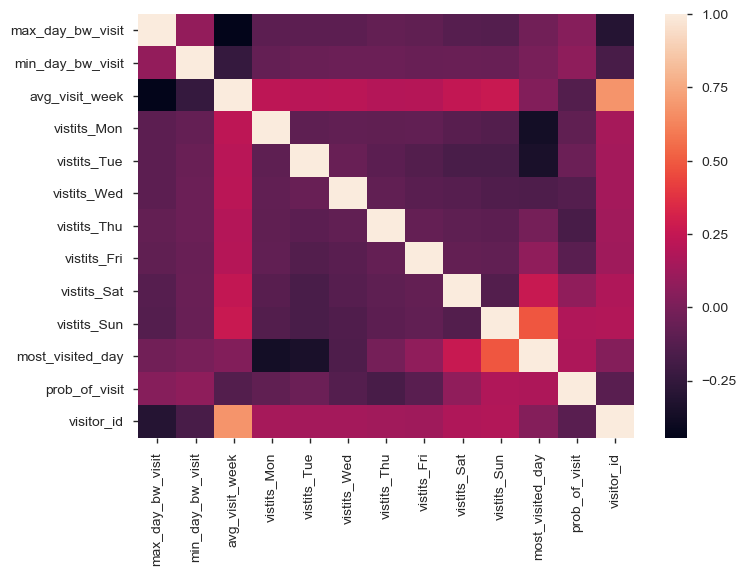

In [161]:
# visualize correlation matrix in Seaborn using a heatmap
sns.heatmap(vdt1.corr())

### Train & Test Split

In [183]:
#Splitting the data

feature_columns = vdt1.columns.difference( ['most_visited_day'] )
#feature_columns1 = feature_columns

In [184]:
from sklearn.cross_validation import train_test_split


train_X, test_X, train_y, test_y = train_test_split( vdt1[feature_columns],
                                                  vdt1['most_visited_day'],
                                                  test_size = 0.3,
                                                  random_state = 42 )

In [185]:
train_X.head()

,avg_visit_week,max_day_bw_visit,min_day_bw_visit,prob_of_visit,visitor_id,vistits_Fri,vistits_Mon,vistits_Sat,vistits_Sun,vistits_Thu,vistits_Tue,vistits_Wed
9889,0.395833,98,1,0.280702,9890,16,6,7,4,6,8,10
11432,0.354167,76,1,0.372549,11433,7,5,19,8,9,3,0
12429,0.354167,96,1,0.450980,12430,3,7,5,23,4,4,5
14454,0.444444,62,1,0.281250,14455,8,4,4,6,10,18,14
14244,0.388889,62,2,0.339286,14245,10,2,19,2,6,16,1


In [186]:
test_X.head()

,avg_visit_week,max_day_bw_visit,min_day_bw_visit,prob_of_visit,visitor_id,vistits_Fri,vistits_Mon,vistits_Sat,vistits_Sun,vistits_Thu,vistits_Tue,vistits_Wed
18567,0.423611,78,1,0.327869,18568,0,12,9,9,4,20,7
17840,0.465278,47,1,0.253731,17841,6,13,17,12,4,11,4
14636,0.472222,61,1,0.250000,14637,5,0,10,16,15,17,5
8369,0.381944,74,1,0.309091,8370,6,13,6,17,1,2,10
4745,0.381944,76,1,0.272727,4746,4,10,11,4,5,15,6


In [188]:
train_y.head()

9889     5
11432    6
12429    7
14454    2
14244    6
Name: most_visited_day, dtype: int64

In [189]:
train_y.head()

9889     5
11432    6
12429    7
14454    2
14244    6
Name: most_visited_day, dtype: int64

### Building a Decision Tree Model


In [162]:
import sklearn.tree as dt

In [163]:
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier, export_graphviz, export
from sklearn.grid_search import GridSearchCV

C:\Users\Harsh\Anaconda3\lib\site-packages\sklearn\grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


In [165]:
vdt1.columns

Index(['max_day_bw_visit', 'min_day_bw_visit', 'avg_visit_week', 'vistits_Mon',
       'vistits_Tue', 'vistits_Wed', 'vistits_Thu', 'vistits_Fri',
       'vistits_Sat', 'vistits_Sun', 'most_visited_day', 'prob_of_visit',
       'visitor_id'],
      dtype='object')

In [167]:
vdt1.head()

,max_day_bw_visit,min_day_bw_visit,avg_visit_week,vistits_Mon,vistits_Tue,vistits_Wed,vistits_Thu,vistits_Fri,vistits_Sat,vistits_Sun,most_visited_day,prob_of_visit,visitor_id
0,111,2,0.180556,2,6,1,6,2,4,5,2,0.230769,1
1,112,2,0.201389,4,0,10,5,6,1,3,3,0.344828,2
2,189,2,0.180556,1,5,1,1,5,8,5,6,0.307692,3
3,155,2,0.173611,5,3,2,2,8,3,2,5,0.320000,4
4,101,2,0.180556,3,11,1,1,4,1,5,2,0.423077,5


In [168]:
# Most Visited day most_visited_day id Y variable as the Customer has visited mostly on this day

In [169]:
vdt_X_col = vdt1.columns.difference(['most_visited_day'])
vdt_X_col.T

Index(['avg_visit_week', 'max_day_bw_visit', 'min_day_bw_visit',
       'prob_of_visit', 'visitor_id', 'vistits_Fri', 'vistits_Mon',
       'vistits_Sat', 'vistits_Sun', 'vistits_Thu', 'vistits_Tue',
       'vistits_Wed'],
      dtype='object')

In [174]:
vdt_X = vdt1[vdt_X_col]
vdt_Y = vdt1['most_visited_day']

In [177]:
vdt_X.shape

(20251, 12)

In [176]:
param_grid = {'max_depth': np.arange(3, 12),
             'max_features': np.arange(3,12)}

In [190]:
tree = GridSearchCV(DecisionTreeClassifier(), param_grid, cv = 5)
tree.fit( train_X, train_y )

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11]), 'max_features': array([3, 4, 5, 6, 7, 8, 9])},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=0)

In [191]:
tree.best_score_

0.9225396825396825

In [192]:
tree.best_estimator_

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=11,
            max_features=9, max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

In [193]:
tree.best_params_

{'max_depth': 11, 'max_features': 9}

In [194]:
train_pred_tree = tree.predict(train_X)

In [196]:
print(metrics.classification_report(train_y, train_pred_tree))

             precision    recall  f1-score   support

          1       0.97      0.96      0.97      2108
          2       0.97      0.98      0.97      2618
          3       0.83      0.96      0.89      1852
          4       0.97      0.90      0.93      1050
          5       0.99      0.85      0.92      1143
          6       0.97      0.95      0.96      2435
          7       0.97      0.97      0.97      2969

avg / total       0.95      0.95      0.95     14175



In [197]:
test_pred = tree.predict(test_X)

In [198]:
print(metrics.classification_report(test_y, test_pred))

             precision    recall  f1-score   support

          1       0.95      0.95      0.95       938
          2       0.95      0.96      0.96      1075
          3       0.79      0.93      0.86       760
          4       0.94      0.85      0.89       527
          5       0.95      0.80      0.87       479
          6       0.94      0.92      0.93      1034
          7       0.96      0.96      0.96      1263

avg / total       0.93      0.93      0.93      6076



### Final Decision Tree Model

In [199]:
clf_tree = DecisionTreeClassifier( max_depth = 11, max_features=9 )
clf_tree.fit( train_X, train_y )

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=11,
            max_features=9, max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

In [200]:
clf_tree.feature_importances_

array([0.00365241, 0.00272472, 0.        , 0.01026664, 0.00258622,
       0.09490368, 0.14440458, 0.16384846, 0.19760346, 0.07995428,
       0.168317  , 0.13173856])

In [202]:
list(zip(train_X.columns,clf_tree.feature_importances_ ))

[('avg_visit_week', 0.0036524097834662365),
 ('max_day_bw_visit', 0.002724719195218218),
 ('min_day_bw_visit', 0.0),
 ('prob_of_visit', 0.01026664189761895),
 ('visitor_id', 0.002586222620169487),
 ('vistits_Fri', 0.09490367701503677),
 ('vistits_Mon', 0.1444045750776955),
 ('vistits_Sat', 0.16384845945682627),
 ('vistits_Sun', 0.19760345522052328),
 ('vistits_Thu', 0.0799542836357417),
 ('vistits_Tue', 0.1683169968611249),
 ('vistits_Wed', 0.1317385592365788)]

In [204]:
tree_test_pred = pd.DataFrame( { 'actual':  test_y,
                            'predicted': clf_tree.predict( test_X ) } )

In [205]:
tree_test_pred.sample( n = 10 )

,actual,predicted
8045,7,7
2006,5,5
2404,7,7
1805,4,1
20239,6,6
13796,1,1
5026,4,4
6932,4,4
17281,2,2
10826,6,6


In [206]:
metrics.accuracy_score( tree_test_pred.actual, tree_test_pred.predicted )

0.9279131007241607

In [210]:
#How good the model is?
predict_proba_df = pd.DataFrame( clf_tree.predict_proba( train_X ) )

In [212]:
predict_proba_df.columns= ['M', 'T','W','Th','F','ST','Sun']

In [213]:
predict_proba_df.head()

,M,T,W,Th,F,ST,Sun
0,0.000000,0.000000,0.002976,0.000000,0.985119,0.011905,0.000000
1,0.007241,0.000000,0.000000,0.002172,0.000000,0.990587,0.000000
2,0.000000,0.005644,0.004105,0.001539,0.000000,0.005131,0.983581
3,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000


In [215]:
print(metrics.classification_report(test_y, test_pred))

             precision    recall  f1-score   support

          1       0.95      0.95      0.95       938
          2       0.95      0.96      0.96      1075
          3       0.79      0.93      0.86       760
          4       0.94      0.85      0.89       527
          5       0.95      0.80      0.87       479
          6       0.94      0.92      0.93      1034
          7       0.96      0.96      0.96      1263

avg / total       0.93      0.93      0.93      6076



In [221]:
vdt_Y.head()

0    2
1    3
2    6
3    5
4    2
Name: most_visited_day, dtype: int64

In [222]:
#Predicting the test cases
shopping_test_pred = pd.DataFrame( { 'actual':  test_y,
                            'predicted': clf_tree.predict( test_X ) } )

In [224]:
#Comparing the predictions with actual test data
shopping_test_pred.sample( n = 10 )

,actual,predicted
19904,4,4
20005,6,6
10752,1,1
16868,7,7
15917,2,2
15963,2,2
1029,7,7
17981,3,3
15443,1,1
4528,1,1


In [225]:
score = metrics.accuracy_score( shopping_test_pred.actual, shopping_test_pred.predicted )
round( float(score), 2 )

0.93